In [2]:
%matplotlib widget
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.lines as mlines
import seaborn as sns
import scipy.sparse as sp
import os
from datetime import datetime, timedelta
from torch_geometric.utils import from_scipy_sparse_matrix

In [3]:
step_minutes = 5

history_len = 12 # THIS DOES NOT CHANGE
future_len = 3 # THIS CHANGES!!!!!!!!!
window_len = history_len + future_len

In [4]:
pems7d_data_per_step_short = 70
pems7d_data_per_step_long = 140

pems7d_initial_train_len = 4537
pems7d_train_len = 10137
pems7d_valid_len = 2534
pems7d_total_len = pems7d_train_len + pems7d_valid_len

pems7d_start_datetime = datetime.strptime("01.05.2012 00:00", "%d.%m.%Y %H:%M") # pems7d - 01.05.2012. - 30.06.2012.

In [5]:
pemsbay_data_per_step_short = 70
pemsbay_data_per_step_long = 140

pemsbay_initial_train_len = 29692
pemsbay_train_len = 41692
pemsbay_valid_len = 10423
pemsbay_total_len = pemsbay_train_len + pemsbay_valid_len

pemsbay_start_datetime = datetime.strptime("01.01.2017 00:00", "%d.%m.%Y %H:%M") # pemsbay - 01.01.2017. - 30.06.2017.

In [6]:
def epoch_to_datetime_pems7d(epoch, data_per_step):
    """Convert epoch index (1-based) into datetime"""
    # initial training data is skipped
    base_minutes = pems7d_initial_train_len * step_minutes
    # each epoch after adds data_per_step * step_minutes
    minutes_after = epoch * data_per_step * step_minutes
    return pems7d_start_datetime + timedelta(minutes=base_minutes + minutes_after)

def epoch_to_datetime_pemsbay(epoch, data_per_step):
    """Convert epoch index (1-based) into datetime"""
    # initial training data is skipped
    base_minutes = pems7d_initial_train_len * step_minutes
    # each epoch after adds data_per_step * step_minutes
    minutes_after = epoch * data_per_step * step_minutes
    return pemsbay_start_datetime + timedelta(minutes=base_minutes + minutes_after)

In [7]:
def plot_pemsbay_communication_cost(pems_bay__experiments, pems_bay__plot_info):
    cloudlet_ids = list(range(7))  # 0–11
    rows, cols = 4, 2

    fig, axes = plt.subplots(rows, cols, figsize=(16, 12), sharex=True, sharey=True)
    axes = axes.flatten()

    exp_color = {
        # "No graph connectivity": "C0",
        "Full graph connectivity":   "C1",
        "Node score algorithm": "C2",
    }

    legend_handles, legend_labels = None, None

    for i, cln_id in enumerate(cloudlet_ids):
        ax = axes[i]

        # plot communication cost (MB) for both experiments
        for label, cfg in pems_bay__experiments.items():
            csv_path = os.path.join(cfg["folder"], f"communication_size/{cln_id}_total_transfer_size_node_features.csv")
            if not os.path.exists(csv_path):
                continue

            df = pd.read_csv(csv_path)
            df = df[df["Epoch"] != 0].reset_index(drop=True)

            datetimes = [epoch_to_datetime_pemsbay(e, cfg["data_per_step"]) for e in df["Epoch"]]
            
            # label only on the first subplot; others use _nolegend_ to avoid duplicates
            plot_label = label if i == 0 else "_nolegend_"
            ax.plot(
                datetimes,
                df["Megabytes"],
                marker="o",
                markersize=2,
                linestyle="-",
                color=exp_color.get(label, None),
                label=plot_label,
            )

        ax.set_title(f"Cloudlet {cln_id + 1}", fontsize=9)
        # ax.set_ylim(0, 1)
        ax.grid(True)
        plt.setp(ax.get_xticklabels(), rotation=30, ha="right")

        # save legend handles/labels from the FIRST subplot
        if i == 0:
            legend_handles, legend_labels = ax.get_legend_handles_labels()

    for j in range(len(cloudlet_ids), len(axes)):
        fig.delaxes(axes[j])

    # figure-level legend (only two entries)
    if legend_handles:
        fig.legend(legend_handles, legend_labels, loc="lower center", ncol=4)
        fig.subplots_adjust(bottom=0.14)  # room for the legend

    # titles & shared labels
    fig.suptitle(f"Communication cost ({pems_bay__plot_info['dataset']}, {pems_bay__plot_info['setup']}, {pems_bay__plot_info['forecast']} forecast, {pems_bay__plot_info['dps']} window timestep)", fontsize=14)
    fig.supxlabel("")
    fig.supylabel("Transfer Size (MB)")

    # layout
    fig.tight_layout(rect=[0, 0.0, 0.98, 0.98])

    plt.show()

    return None

In [21]:
def plot_pems7d_communication_cost(pems7d__experiments, pems7d__plot_info):
    cloudlet_ids = list(range(12))  # 0–11
    rows, cols = 6, 2 # 4, 3

    fig, axes = plt.subplots(rows, cols, figsize=(16, 12), sharex=True, sharey=True)
    axes = axes.flatten()

    exp_color = {
        # "No graph connectivity": "C0",
        "Full graph connectivity":   "C1",
        "Node score algorithm": "C2",
    }

    legend_handles, legend_labels = None, None

    for i, cln_id in enumerate(cloudlet_ids):
        ax = axes[i]

        # plot communication cost (MB) for both experiments
        for label, cfg in pems7d__experiments.items():
            csv_path = os.path.join(cfg["folder"], f"communication_size/{cln_id}_total_transfer_size_node_features.csv")
            if not os.path.exists(csv_path):
                continue

            df = pd.read_csv(csv_path)
            df = df[df["Epoch"] != 0].reset_index(drop=True)
            
            datetimes = [epoch_to_datetime_pems7d(e, cfg["data_per_step"]) for e in df["Epoch"]]
            
            # label only on the first subplot; others use _nolegend_ to avoid duplicates
            plot_label = label if i == 0 else "_nolegend_"
            ax.plot(
                datetimes,
                df["Megabytes"].astype(float),
                marker="o",
                markersize=2,
                linestyle="-",
                color=exp_color.get(label, None),
                label=plot_label,
            )

        ax.set_title(f"Cloudlet {cln_id}", fontsize=9)
        # ax.set_ylim(0, 1)
        ax.grid(True)
        plt.setp(ax.get_xticklabels(), rotation=30, ha="right")

        # save legend handles/labels from the FIRST subplot
        if i == 0:
            legend_handles, legend_labels = ax.get_legend_handles_labels()

    # figure-level legend (only two entries)
    if legend_handles:
        fig.legend(legend_handles, legend_labels, loc="lower center", ncol=4)
        fig.subplots_adjust(bottom=0.14)  # room for the legend

    # titles & shared labels
    fig.suptitle(f"Communication cost ({pems7d__plot_info['dataset']}, {pems7d__plot_info['setup']}, {pems7d__plot_info['forecast']} forecast, {pems7d__plot_info['dps']} window timestep)", fontsize=14)
    fig.supxlabel("")
    fig.supylabel("Transfer Size (MB)")

    # layout
    fig.tight_layout(rect=[0, 0.0, 0.98, 0.98])

    plt.show()

    return None

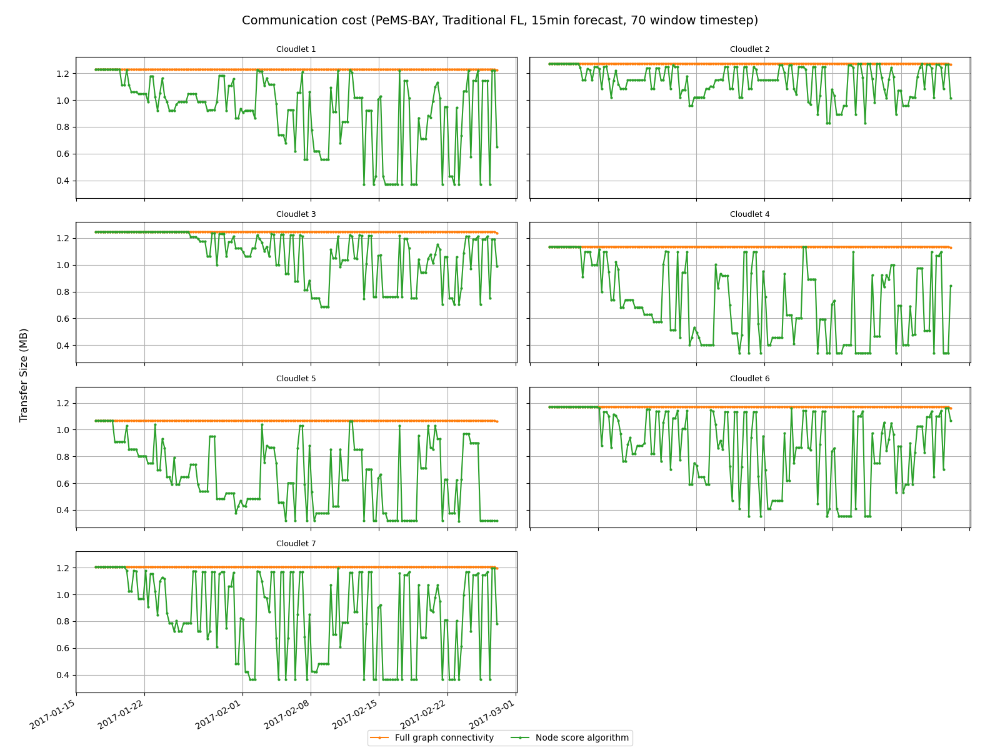

In [15]:
pems_bay__trad_fl__15min__dps70__with_algorithm__log_folder = '../logs/2025-09-10_14-42-09_pems-bay_pred-15min_dps-70_trad-fl-distance_online-training_with_algorithm'
pems_bay__trad_fl__15min__dps70__no_graph_connectivity__log_folder = '../logs/2025-09-08_14-41-12_pems-bay_pred-15min_dps-70_trad-fl-distance_online-training_no_graph_connectivity'
pems_bay__trad_fl__15min__dps70__no_algorithm__log_folder = '../logs/2025-09-05_20-33-32_pems-bay_pred-15min_dps-70_trad-fl-distance_online-training_no_algorithm'

pems_bay__plot_info = {
    "dataset": "PeMS-BAY",
    "setup": "Traditional FL",
    "forecast": "15min",
    "dps": 70,
}

pems_bay__experiments = {
    # "No graph connectivity": {
    #     "folder": f"{pems_bay__trad_fl__15min__dps70__no_graph_connectivity__log_folder}",
    #     "data_per_step": 70
    # },
    "Full graph connectivity": {
        "folder": f"{pems_bay__trad_fl__15min__dps70__no_algorithm__log_folder}",
        "data_per_step": 70
    },
    "Node score algorithm": {
        "folder": f"{pems_bay__trad_fl__15min__dps70__with_algorithm__log_folder}",
        "data_per_step": 70
    },
}

plot_pemsbay_communication_cost(pems_bay__experiments, pems_bay__plot_info)

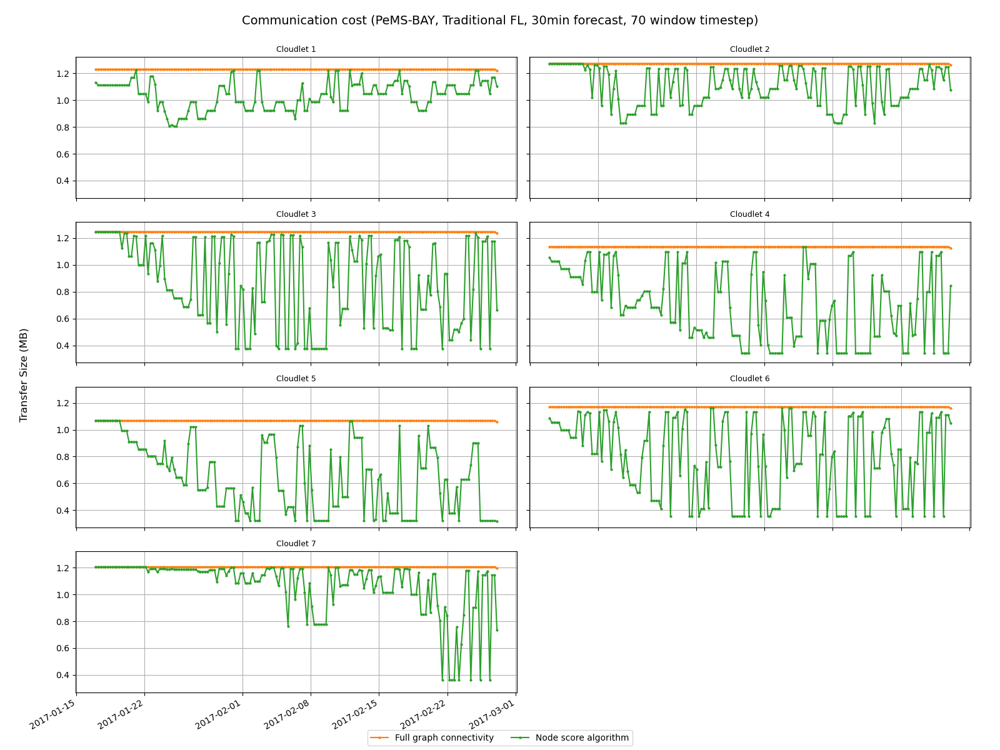

In [16]:
pems_bay__trad_fl__30min__dps70__with_algorithm__log_folder = '../logs/2025-09-10_16-25-54_pems-bay_pred-30min_dps-70_trad-fl-distance_online-training_with_algorithm'
pems_bay__trad_fl__30min__dps70__no_graph_connectivity__log_folder = '../logs/2025-09-08_15-02-02_pems-bay_pred-30min_dps-70_trad-fl-distance_online-training_no_graph_connectivity'
pems_bay__trad_fl__30min__dps70__no_algorithm__log_folder = '../logs/2025-09-05_22-03-31_pems-bay_pred-30min_dps-70_trad-fl-distance_online-training_no_algorithm'

pems_bay__plot_info = {
    "dataset": "PeMS-BAY",
    "setup": "Traditional FL",
    "forecast": "30min",
    "dps": 70,
}

pems_bay__experiments = {
    # "No graph connectivity": {
    #     "folder": f"{pems_bay__trad_fl__30min__dps70__no_graph_connectivity__log_folder}",
    #     "data_per_step": 70
    # },
    "Full graph connectivity": {
        "folder": f"{pems_bay__trad_fl__30min__dps70__no_algorithm__log_folder}",
        "data_per_step": 70
    },
    "Node score algorithm": {
        "folder": f"{pems_bay__trad_fl__30min__dps70__with_algorithm__log_folder}",
        "data_per_step": 70
    },
}

plot_pemsbay_communication_cost(pems_bay__experiments, pems_bay__plot_info)

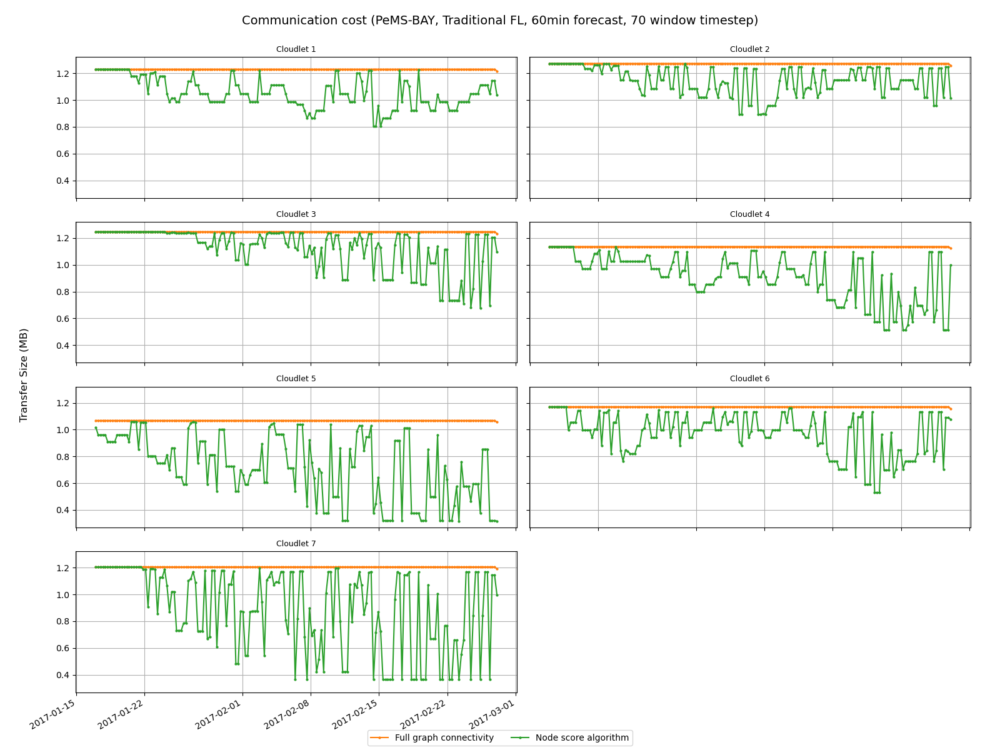

In [17]:
pems_bay__trad_fl__60min__dps70__with_algorithm__log_folder = '../logs/2025-09-10_18-11-19_pems-bay_pred-60min_dps-70_trad-fl-distance_online-training_with_algorithm'
pems_bay__trad_fl__60min__dps70__no_graph_connectivity__log_folder = '../logs/2025-09-08_15-22-41_pems-bay_pred-60min_dps-70_trad-fl-distance_online-training_no_graph_connectivity'
pems_bay__trad_fl__60min__dps70__no_algorithm__log_folder = '../logs/2025-09-05_23-33-15_pems-bay_pred-60min_dps-70_trad-fl-distance_online-training_no_algorithm'

pems_bay__plot_info = {
    "dataset": "PeMS-BAY",
    "setup": "Traditional FL",
    "forecast": "60min",
    "dps": 70,
}

pems_bay__experiments = {
    # "No graph connectivity": {
    #     "folder": f"{pems_bay__trad_fl__60min__dps70__no_graph_connectivity__log_folder}",
    #     "data_per_step": 70
    # },
    "Full graph connectivity": {
        "folder": f"{pems_bay__trad_fl__60min__dps70__no_algorithm__log_folder}",
        "data_per_step": 70
    },
    "Node score algorithm": {
        "folder": f"{pems_bay__trad_fl__60min__dps70__with_algorithm__log_folder}",
        "data_per_step": 70
    },
}

plot_pemsbay_communication_cost(pems_bay__experiments, pems_bay__plot_info)

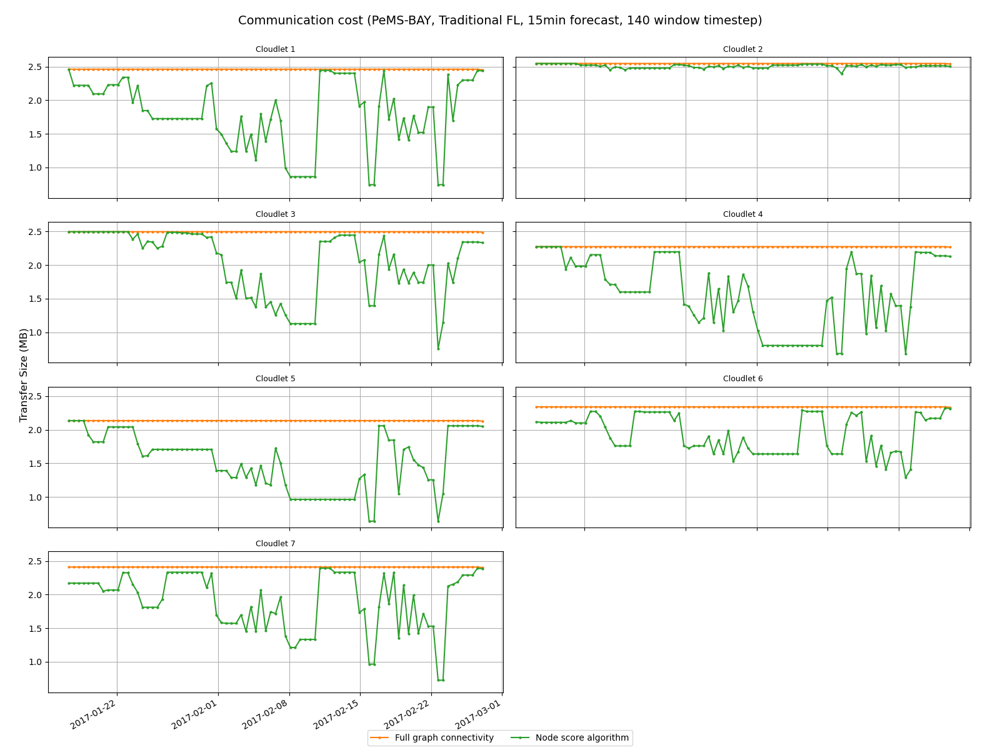

In [18]:
pems_bay__trad_fl__15min__dps140__with_algorithm__log_folder = '../logs/2025-09-10_09-49-06_pems-bay_pred-15min_dps-140_trad-fl-distance_online-training_with_algorithm'
pems_bay__trad_fl__15min__dps140__no_graph_connectivity__log_folder = '../logs/2025-09-08_13-39-31_pems-bay_pred-15min_dps-140_trad-fl-distance_online-training_no_graph_connectivity'
pems_bay__trad_fl__15min__dps140__no_algorithm__log_folder = '../logs/2025-09-05_16-04-07_pems-bay_pred-15min_dps-140_trad-fl-distance_online-training_no_algorithm'

pems_bay__plot_info = {
    "dataset": "PeMS-BAY",
    "setup": "Traditional FL",
    "forecast": "15min",
    "dps": 140,
}

pems_bay__experiments = {
    # "No graph connectivity": {
    #     "folder": f"{pems_bay__trad_fl__15min__dps140__no_graph_connectivity__log_folder}",
    #     "data_per_step": 140
    # },
    "Full graph connectivity": {
        "folder": f"{pems_bay__trad_fl__15min__dps140__no_algorithm__log_folder}",
        "data_per_step": 140
    },
    "Node score algorithm": {
        "folder": f"{pems_bay__trad_fl__15min__dps140__with_algorithm__log_folder}",
        "data_per_step": 140
    },
}

plot_pemsbay_communication_cost(pems_bay__experiments, pems_bay__plot_info)

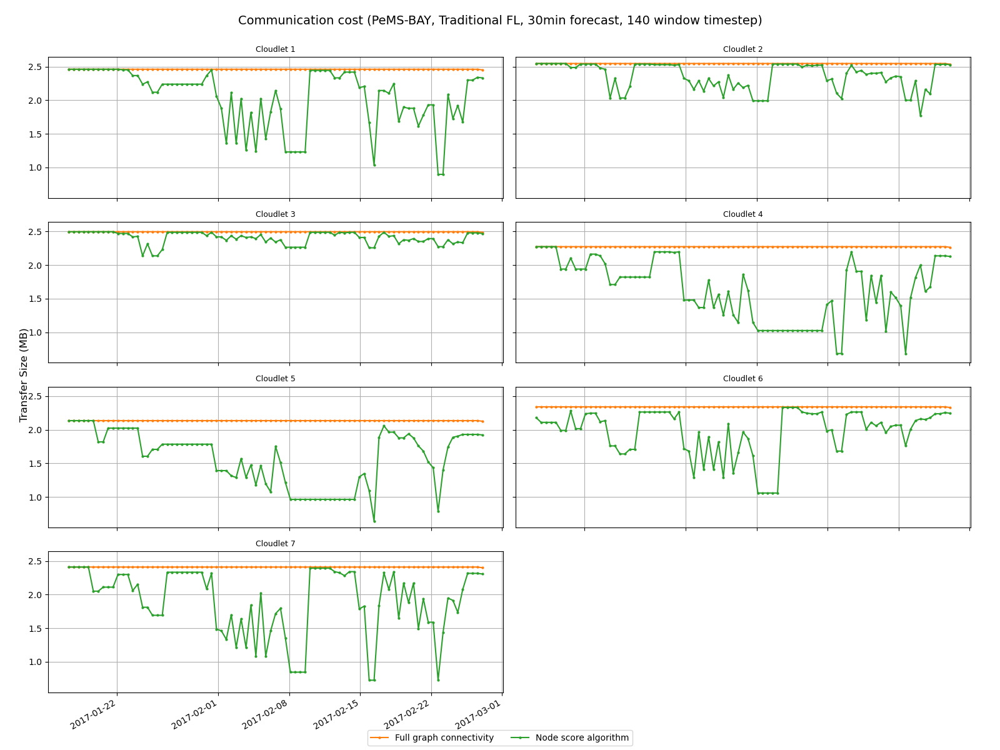

In [19]:
pems_bay__trad_fl__30min__dps140__with_algorithm__log_folder = '../logs/2025-09-10_11-23-27_pems-bay_pred-30min_dps-140_trad-fl-distance_online-training_with_algorithm'
pems_bay__trad_fl__30min__dps140__no_graph_connectivity__log_folder = '../logs/2025-09-08_14-00-05_pems-bay_pred-30min_dps-140_trad-fl-distance_online-training_no_graph_connectivity'
pems_bay__trad_fl__30min__dps140__no_algorithm__log_folder = '../logs/2025-09-05_17-33-57_pems-bay_pred-30min_dps-140_trad-fl-distance_online-training_no_algorithm'

pems_bay__plot_info = {
    "dataset": "PeMS-BAY",
    "setup": "Traditional FL",
    "forecast": "30min",
    "dps": 140,
}

pems_bay__experiments = {
    # "No graph connectivity": {
    #     "folder": f"{pems_bay__trad_fl__30min__dps140__no_graph_connectivity__log_folder}",
    #     "data_per_step": 140
    # },
    "Full graph connectivity": {
        "folder": f"{pems_bay__trad_fl__30min__dps140__no_algorithm__log_folder}",
        "data_per_step": 140
    },
    "Node score algorithm": {
        "folder": f"{pems_bay__trad_fl__30min__dps140__with_algorithm__log_folder}",
        "data_per_step": 140
    },
}

plot_pemsbay_communication_cost(pems_bay__experiments, pems_bay__plot_info)

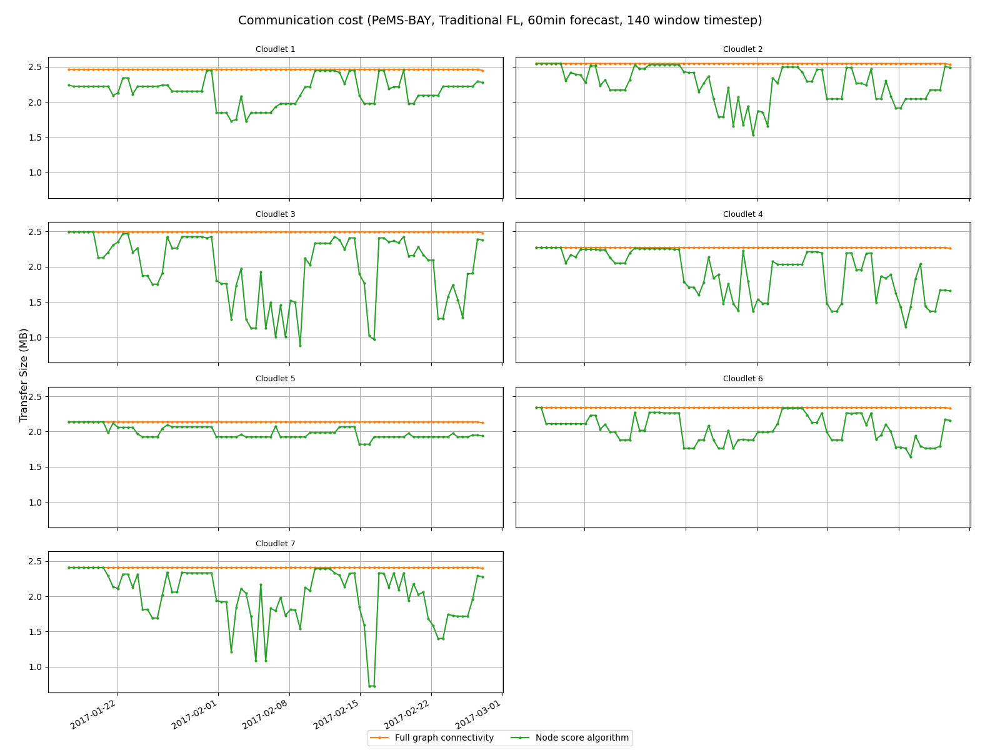

In [20]:
pems_bay__trad_fl__60min__dps140__with_algorithm__log_folder = '../logs/2025-09-10_13-00-40_pems-bay_pred-60min_dps-140_trad-fl-distance_online-training_with_algorithm'
pems_bay__trad_fl__60min__dps140__no_graph_connectivity__log_folder = '../logs/2025-09-08_14-20-44_pems-bay_pred-60min_dps-140_trad-fl-distance_online-training_no_graph_connectivity'
pems_bay__trad_fl__60min__dps140__no_algorithm__log_folder = '../logs/2025-09-05_19-03-50_pems-bay_pred-60min_dps-140_trad-fl-distance_online-training_no_algorithm'

pems_bay__plot_info = {
    "dataset": "PeMS-BAY",
    "setup": "Traditional FL",
    "forecast": "60min",
    "dps": 140,
}

pems_bay__experiments = {
    # "No graph connectivity": {
    #     "folder": f"{pems_bay__trad_fl__60min__dps140__no_graph_connectivity__log_folder}",
    #     "data_per_step": 140
    # },
    "Full graph connectivity": {
        "folder": f"{pems_bay__trad_fl__60min__dps140__no_algorithm__log_folder}",
        "data_per_step": 140
    },
    "Node score algorithm": {
        "folder": f"{pems_bay__trad_fl__60min__dps140__with_algorithm__log_folder}",
        "data_per_step": 140
    },
}

plot_pemsbay_communication_cost(pems_bay__experiments, pems_bay__plot_info)

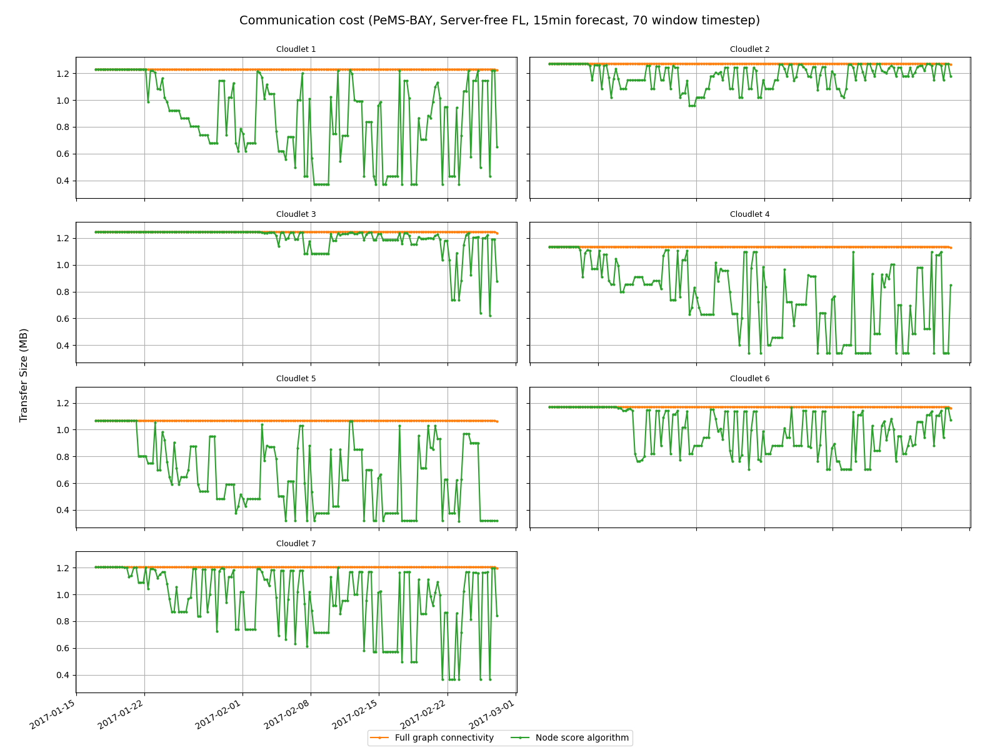

In [21]:
pems_bay__server_free_fl__15min__dps70__with_algorithm__log_folder = '../logs/2025-09-12_15-41-00_pems-bay_pred-15min_dps-70_server-free-fl-distance_online-training_with_algorithm'
pems_bay__server_free_fl__15min__dps70__no_graph_connectivity__log_folder = '../logs/2025-09-08_17-47-24_pems-bay_pred-15min_dps-70_server-free-fl-distance_online-training_no_graph_connectivity'
pems_bay__server_free_fl__15min__dps70__no_algorithm__log_folder = '../logs/2025-09-06_09-37-24_pems-bay_pred-15min_dps-70_server-free-fl-distance_online-training_no_algorithm'

pems_bay__plot_info = {
    "dataset": "PeMS-BAY",
    "setup": "Server-free FL",
    "forecast": "15min",
    "dps": 70,
}

pems_bay__experiments = {
    # "No graph connectivity": {
    #     "folder": f"{pems_bay__server_free_fl__15min__dps70__no_graph_connectivity__log_folder}",
    #     "data_per_step": 70
    # },
    "Full graph connectivity": {
        "folder": f"{pems_bay__server_free_fl__15min__dps70__no_algorithm__log_folder}",
        "data_per_step": 70
    },
    "Node score algorithm": {
        "folder": f"{pems_bay__server_free_fl__15min__dps70__with_algorithm__log_folder}",
        "data_per_step": 70
    },
}

plot_pemsbay_communication_cost(pems_bay__experiments, pems_bay__plot_info)

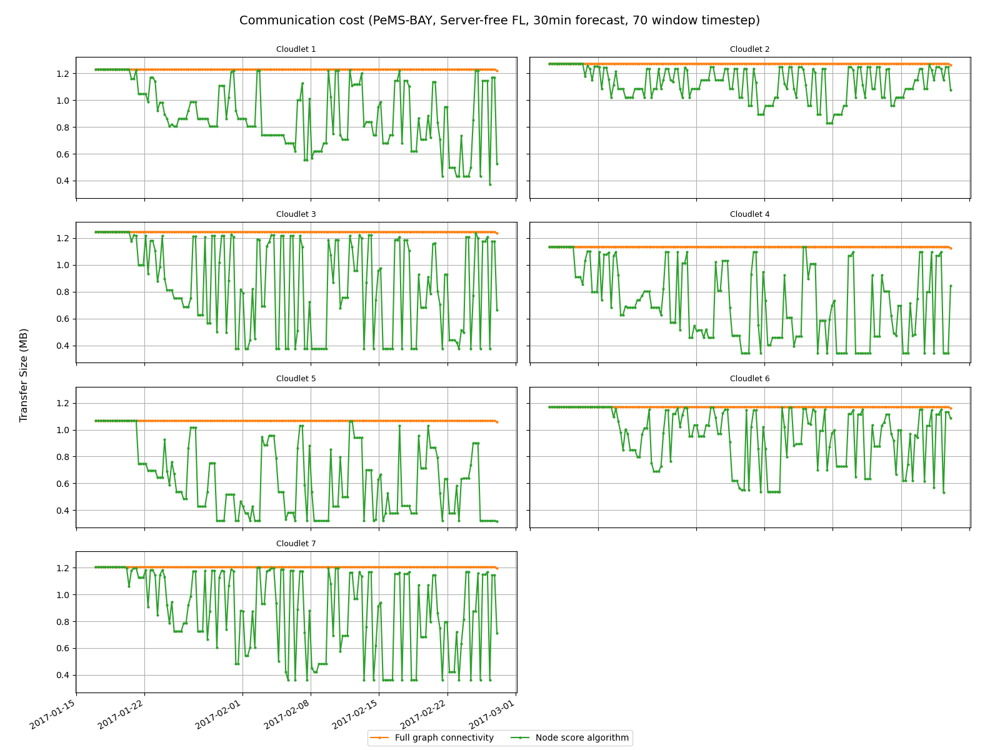

In [22]:
pems_bay__server_free_fl__30min__dps70__with_algorithm__log_folder = '../logs/2025-09-12_18-14-46_pems-bay_pred-30min_dps-70_server-free-fl-distance_online-training_with_algorithm'
pems_bay__server_free_fl__30min__dps70__no_graph_connectivity__log_folder = '../logs/2025-09-08_18-00-04_pems-bay_pred-30min_dps-70_server-free-fl-distance_online-training_no_graph_connectivity'
pems_bay__server_free_fl__30min__dps70__no_algorithm__log_folder = '../logs/2025-09-06_11-09-21_pems-bay_pred-30min_dps-70_server-free-fl-distance_online-training_no_algorithm'

pems_bay__plot_info = {
    "dataset": "PeMS-BAY",
    "setup": "Server-free FL",
    "forecast": "30min",
    "dps": 70,
}

pems_bay__experiments = {
    # "No graph connectivity": {
    #     "folder": f"{pems_bay__server_free_fl__30min__dps70__no_graph_connectivity__log_folder}",
    #     "data_per_step": 70
    # },
    "Full graph connectivity": {
        "folder": f"{pems_bay__server_free_fl__30min__dps70__no_algorithm__log_folder}",
        "data_per_step": 70
    },
    "Node score algorithm": {
        "folder": f"{pems_bay__server_free_fl__30min__dps70__with_algorithm__log_folder}",
        "data_per_step": 70
    },
}

plot_pemsbay_communication_cost(pems_bay__experiments, pems_bay__plot_info)

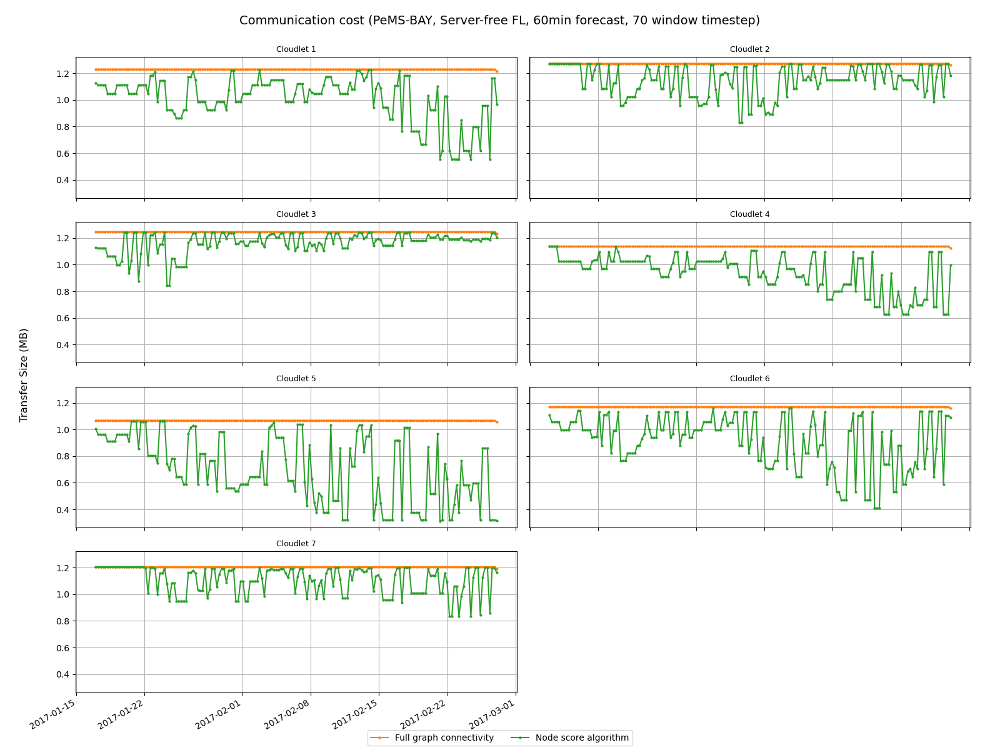

In [23]:
pems_bay__server_free_fl__60min__dps70__with_algorithm__log_folder = '../logs/2025-09-12_20-42-41_pems-bay_pred-60min_dps-70_server-free-fl-distance_online-training_with_algorithm'
pems_bay__server_free_fl__60min__dps70__no_graph_connectivity__log_folder = '../logs/2025-09-08_18-12-45_pems-bay_pred-60min_dps-70_server-free-fl-distance_online-training_no_graph_connectivity'
pems_bay__server_free_fl__60min__dps70__no_algorithm__log_folder = '../logs/2025-09-06_12-41-40_pems-bay_pred-60min_dps-70_server-free-fl-distance_online-training_no_algorithm'

pems_bay__plot_info = {
    "dataset": "PeMS-BAY",
    "setup": "Server-free FL",
    "forecast": "60min",
    "dps": 70,
}

pems_bay__experiments = {
    # "No graph connectivity": {
    #     "folder": f"{pems_bay__server_free_fl__60min__dps70__no_graph_connectivity__log_folder}",
    #     "data_per_step": 70
    # },
    "Full graph connectivity": {
        "folder": f"{pems_bay__server_free_fl__60min__dps70__no_algorithm__log_folder}",
        "data_per_step": 70
    },
    "Node score algorithm": {
        "folder": f"{pems_bay__server_free_fl__60min__dps70__with_algorithm__log_folder}",
        "data_per_step": 70
    },
}

plot_pemsbay_communication_cost(pems_bay__experiments, pems_bay__plot_info)

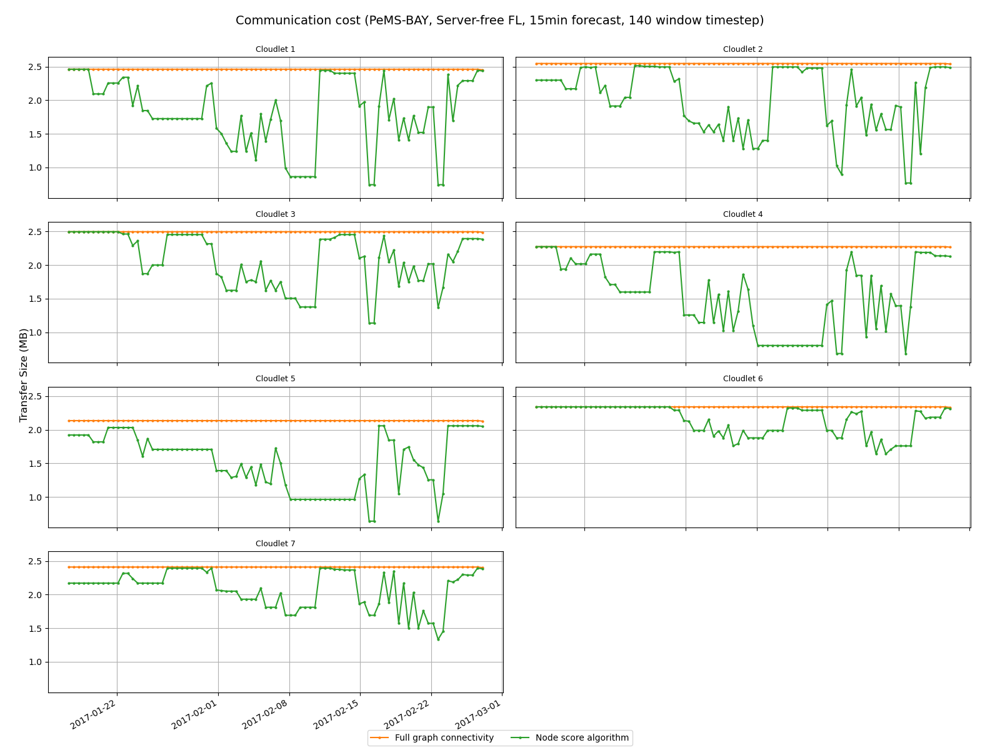

In [24]:
pems_bay__server_free_fl__15min__dps140__with_algorithm__log_folder = '../logs/2025-09-12_09-32-23_pems-bay_pred-15min_dps-140_server-free-fl-distance_online-training_with_algorithm'
pems_bay__server_free_fl__15min__dps140__no_graph_connectivity__log_folder = '../logs/2025-09-08_17-10-11_pems-bay_pred-15min_dps-140_server-free-fl-distance_online-training_no_graph_connectivity'
pems_bay__server_free_fl__15min__dps140__no_algorithm__log_folder = '../logs/2025-09-06_05-00-38_pems-bay_pred-15min_dps-140_server-free-fl-distance_online-training_no_algorithm'

pems_bay__plot_info = {
    "dataset": "PeMS-BAY",
    "setup": "Server-free FL",
    "forecast": "15min",
    "dps": 140,
}

pems_bay__experiments = {
    # "No graph connectivity": {
    #     "folder": f"{pems_bay__server_free_fl__15min__dps140__no_graph_connectivity__log_folder}",
    #     "data_per_step": 140
    # },
    "Full graph connectivity": {
        "folder": f"{pems_bay__server_free_fl__15min__dps140__no_algorithm__log_folder}",
        "data_per_step": 140
    },
    "Node score algorithm": {
        "folder": f"{pems_bay__server_free_fl__15min__dps140__with_algorithm__log_folder}",
        "data_per_step": 140
    },
}

plot_pemsbay_communication_cost(pems_bay__experiments, pems_bay__plot_info)

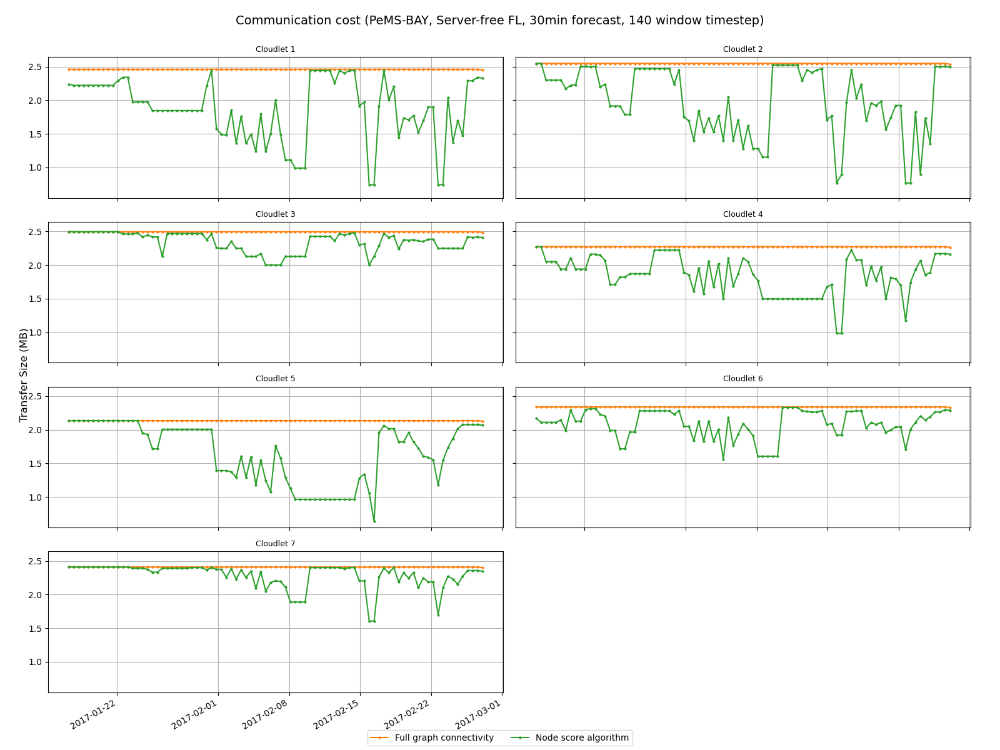

In [25]:
pems_bay__server_free_fl__30min__dps140__with_algorithm__log_folder = '../logs/2025-09-12_11-30-29_pems-bay_pred-30min_dps-140_server-free-fl-distance_online-training_with_algorithm'
pems_bay__server_free_fl__30min__dps140__no_graph_connectivity__log_folder = '../logs/2025-09-08_17-22-34_pems-bay_pred-30min_dps-140_server-free-fl-distance_online-training_no_graph_connectivity'
pems_bay__server_free_fl__30min__dps140__no_algorithm__log_folder = '../logs/2025-09-06_06-32-46_pems-bay_pred-30min_dps-140_server-free-fl-distance_online-training_no_algorithm'

pems_bay__plot_info = {
    "dataset": "PeMS-BAY",
    "setup": "Server-free FL",
    "forecast": "30min",
    "dps": 140,
}

pems_bay__experiments = {
    # "No graph connectivity": {
    #     "folder": f"{pems_bay__server_free_fl__30min__dps140__no_graph_connectivity__log_folder}",
    #     "data_per_step": 140
    # },
    "Full graph connectivity": {
        "folder": f"{pems_bay__server_free_fl__30min__dps140__no_algorithm__log_folder}",
        "data_per_step": 140
    },
    "Node score algorithm": {
        "folder": f"{pems_bay__server_free_fl__30min__dps140__with_algorithm__log_folder}",
        "data_per_step": 140
    },
}

plot_pemsbay_communication_cost(pems_bay__experiments, pems_bay__plot_info)

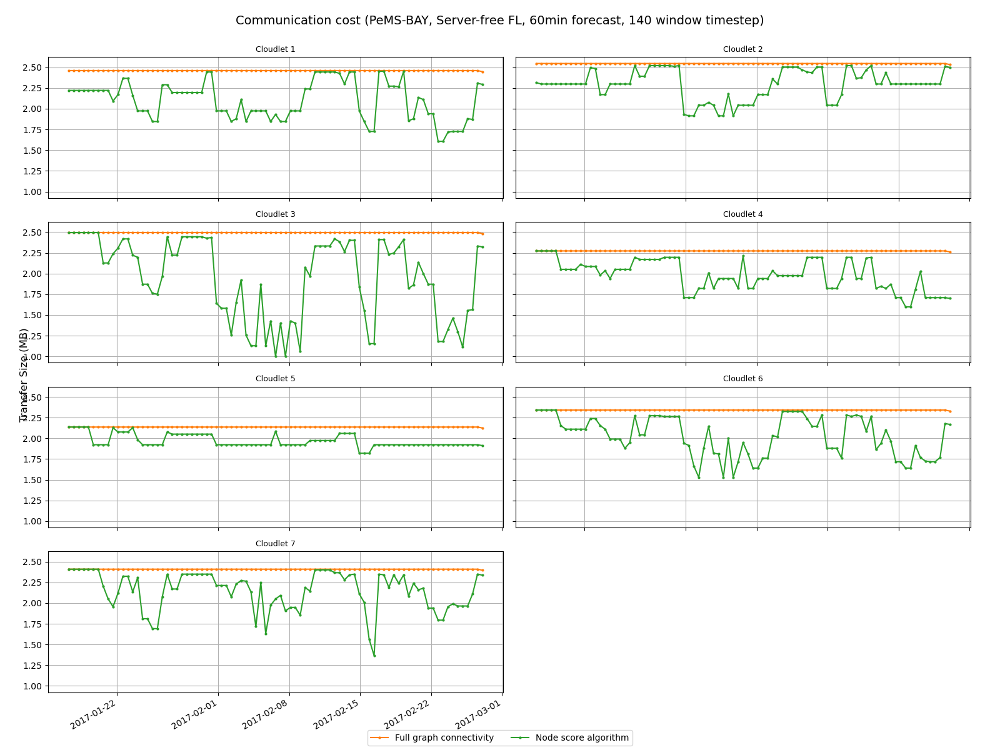

In [26]:
pems_bay__server_free_fl__60min__dps140__with_algorithm__log_folder = '../logs/2025-09-12_13-32-51_pems-bay_pred-60min_dps-140_server-free-fl-distance_online-training_with_algorithm'
pems_bay__server_free_fl__60min__dps140__no_graph_connectivity__log_folder = '../logs/2025-09-08_17-34-59_pems-bay_pred-60min_dps-140_server-free-fl-distance_online-training_no_graph_connectivity'
pems_bay__server_free_fl__60min__dps140__no_algorithm__log_folder = '../logs/2025-09-06_08-05-08_pems-bay_pred-60min_dps-140_server-free-fl-distance_online-training_no_algorithm'

pems_bay__plot_info = {
    "dataset": "PeMS-BAY",
    "setup": "Server-free FL",
    "forecast": "60min",
    "dps": 140,
}

pems_bay__experiments = {
    # "No graph connectivity": {
    #     "folder": f"{pems_bay__server_free_fl__60min__dps140__no_graph_connectivity__log_folder}",
    #     "data_per_step": 140
    # },
    "Full graph connectivity": {
        "folder": f"{pems_bay__server_free_fl__60min__dps140__no_algorithm__log_folder}",
        "data_per_step": 140
    },
    "Node score algorithm": {
        "folder": f"{pems_bay__server_free_fl__60min__dps140__with_algorithm__log_folder}",
        "data_per_step": 140
    },
}

plot_pemsbay_communication_cost(pems_bay__experiments, pems_bay__plot_info)

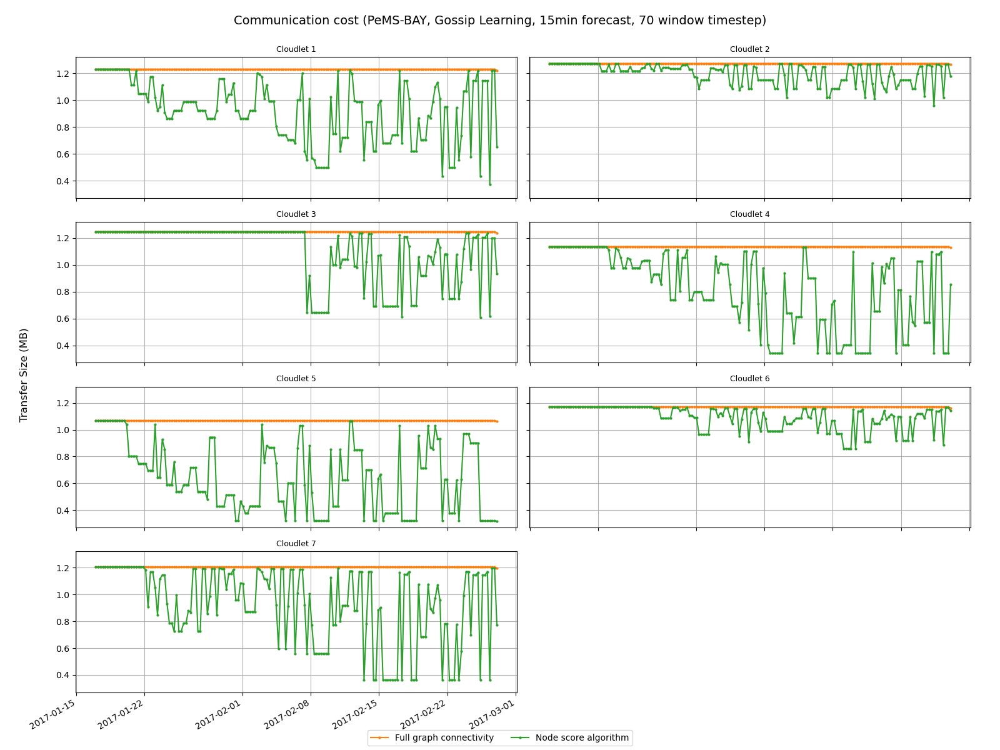

In [12]:
pems_bay__gossip_learning__15min__dps70__with_algorithm__log_folder = '../logs/2025-09-18_17-50-44_pems-bay_pred-15min_dps-70_gossip-learning-distance_online-training_with_algorithm'
pems_bay__gossip_learning__15min__dps70__no_graph_connectivity__log_folder = '../logs/2025-09-08_19-46-03_pems-bay_pred-15min_dps-70_gossip-learning-distance_online-training_no_graph_connectivity'
pems_bay__gossip_learning__15min__dps70__no_algorithm__log_folder = '../logs/2025-09-06_22-35-25_pems-bay_pred-15min_dps-70_gossip-learning-distance_online-training_no_algorithm'

pems_bay__plot_info = {
    "dataset": "PeMS-BAY",
    "setup": "Gossip Learning",
    "forecast": "15min",
    "dps": 70,
}

pems_bay__experiments = {
    # "No graph connectivity": {
    #     "folder": f"{pems_bay__gossip_learning__15min__dps70__no_graph_connectivity__log_folder}",
    #     "data_per_step": 70
    # },
    "Full graph connectivity": {
        "folder": f"{pems_bay__gossip_learning__15min__dps70__no_algorithm__log_folder}",
        "data_per_step": 70
    },
    "Node score algorithm": {
        "folder": f"{pems_bay__gossip_learning__15min__dps70__with_algorithm__log_folder}",
        "data_per_step": 70
    },
}

plot_pemsbay_communication_cost(pems_bay__experiments, pems_bay__plot_info)

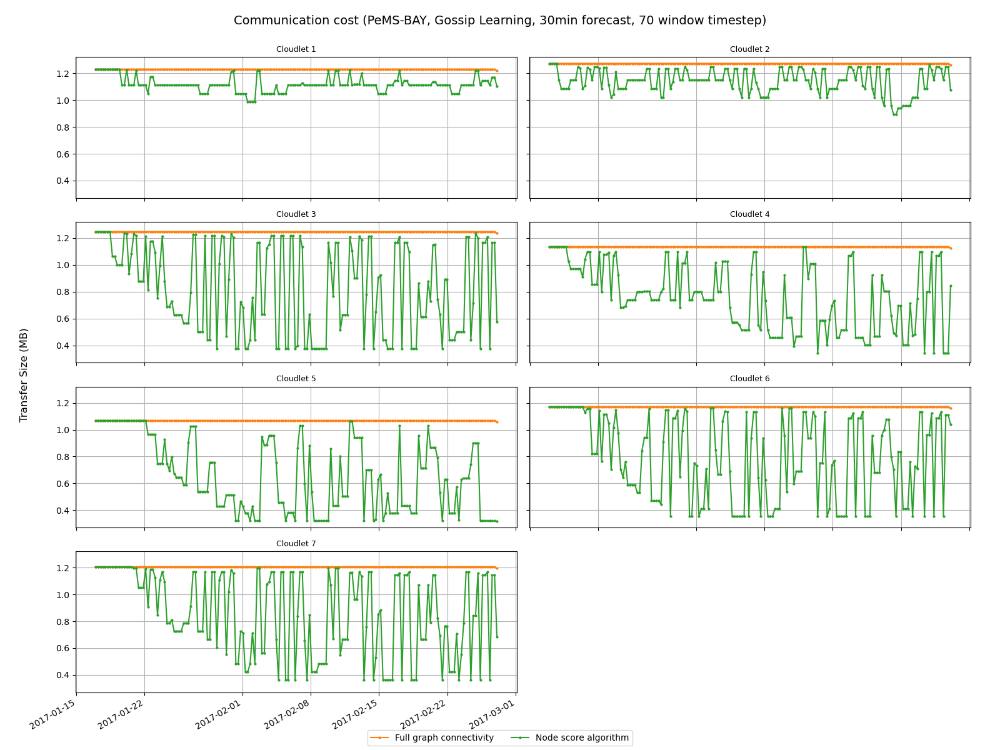

In [13]:
pems_bay__gossip_learning__30min__dps70__with_algorithm__log_folder = '../logs/2025-09-18_20-15-19_pems-bay_pred-30min_dps-70_gossip-learning-distance_online-training_with_algorithm'
pems_bay__gossip_learning__30min__dps70__no_graph_connectivity__log_folder = '../logs/2025-09-08_19-58-48_pems-bay_pred-30min_dps-70_gossip-learning-distance_online-training_no_graph_connectivity'
pems_bay__gossip_learning__30min__dps70__no_algorithm__log_folder = '../logs/2025-09-07_00-07-14_pems-bay_pred-30min_dps-70_gossip-learning-distance_online-training_no_algorithm'

pems_bay__plot_info = {
    "dataset": "PeMS-BAY",
    "setup": "Gossip Learning",
    "forecast": "30min",
    "dps": 70,
}

pems_bay__experiments = {
    # "No graph connectivity": {
    #     "folder": f"{pems_bay__gossip_learning__30min__dps70__no_graph_connectivity__log_folder}",
    #     "data_per_step": 70
    # },
    "Full graph connectivity": {
        "folder": f"{pems_bay__gossip_learning__30min__dps70__no_algorithm__log_folder}",
        "data_per_step": 70
    },
    "Node score algorithm": {
        "folder": f"{pems_bay__gossip_learning__30min__dps70__with_algorithm__log_folder}",
        "data_per_step": 70
    },
}

plot_pemsbay_communication_cost(pems_bay__experiments, pems_bay__plot_info)

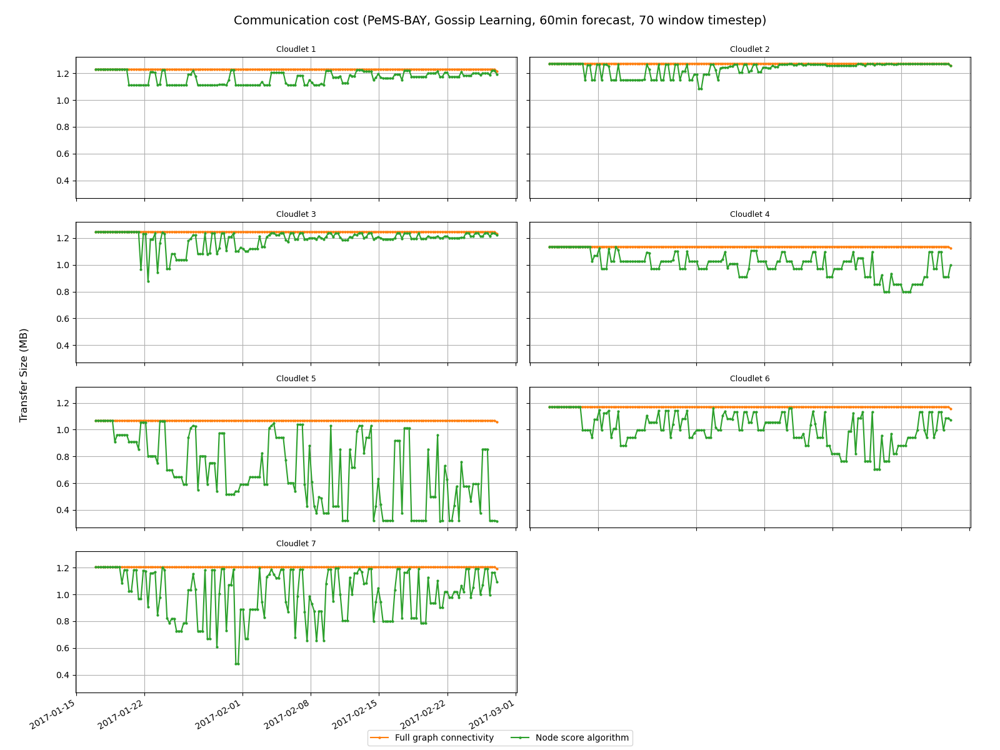

In [14]:
pems_bay__gossip_learning__60min__dps70__with_algorithm__log_folder = '../logs/2025-09-18_22-37-44_pems-bay_pred-60min_dps-70_gossip-learning-distance_online-training_with_algorithm'
pems_bay__gossip_learning__60min__dps70__no_graph_connectivity__log_folder = '../logs/2025-09-08_20-11-31_pems-bay_pred-60min_dps-70_gossip-learning-distance_online-training_no_graph_connectivity'
pems_bay__gossip_learning__60min__dps70__no_algorithm__log_folder = '../logs/2025-09-07_01-39-17_pems-bay_pred-60min_dps-70_gossip-learning-distance_online-training_no_algorithm'

pems_bay__plot_info = {
    "dataset": "PeMS-BAY",
    "setup": "Gossip Learning",
    "forecast": "60min",
    "dps": 70,
}

pems_bay__experiments = {
    # "No graph connectivity": {
    #     "folder": f"{pems_bay__gossip_learning__60min__dps70__no_graph_connectivity__log_folder}",
    #     "data_per_step": 70
    # },
    "Full graph connectivity": {
        "folder": f"{pems_bay__gossip_learning__60min__dps70__no_algorithm__log_folder}",
        "data_per_step": 70
    },
    "Node score algorithm": {
        "folder": f"{pems_bay__gossip_learning__60min__dps70__with_algorithm__log_folder}",
        "data_per_step": 70
    },
}

plot_pemsbay_communication_cost(pems_bay__experiments, pems_bay__plot_info)

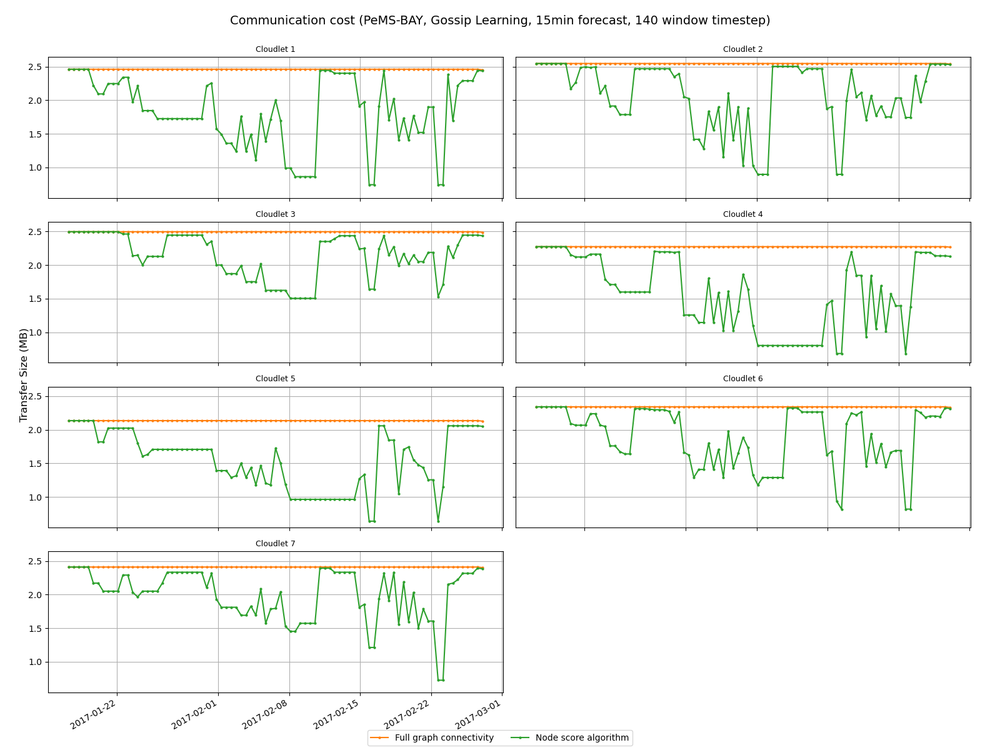

In [15]:
pems_bay__gossip_learning__15min__dps140__with_algorithm__log_folder = '../logs/2025-09-18_12-03-51_pems-bay_pred-15min_dps-140_gossip-learning-distance_online-training_with_algorithm'
pems_bay__gossip_learning__15min__dps140__no_graph_connectivity__log_folder = '../logs/2025-09-08_19-08-38_pems-bay_pred-15min_dps-140_gossip-learning-distance_online-training_no_graph_connectivity'
pems_bay__gossip_learning__15min__dps140__no_algorithm__log_folder = '../logs/2025-09-06_17-59-17_pems-bay_pred-15min_dps-140_gossip-learning-distance_online-training_no_algorithm'

pems_bay__plot_info = {
    "dataset": "PeMS-BAY",
    "setup": "Gossip Learning",
    "forecast": "15min",
    "dps": 140,
}

pems_bay__experiments = {
    # "No graph connectivity": {
    #     "folder": f"{pems_bay__gossip_learning__15min__dps140__no_graph_connectivity__log_folder}",
    #     "data_per_step": 140
    # },
    "Full graph connectivity": {
        "folder": f"{pems_bay__gossip_learning__15min__dps140__no_algorithm__log_folder}",
        "data_per_step": 140
    },
    "Node score algorithm": {
        "folder": f"{pems_bay__gossip_learning__15min__dps140__with_algorithm__log_folder}",
        "data_per_step": 140
    },
}

plot_pemsbay_communication_cost(pems_bay__experiments, pems_bay__plot_info)

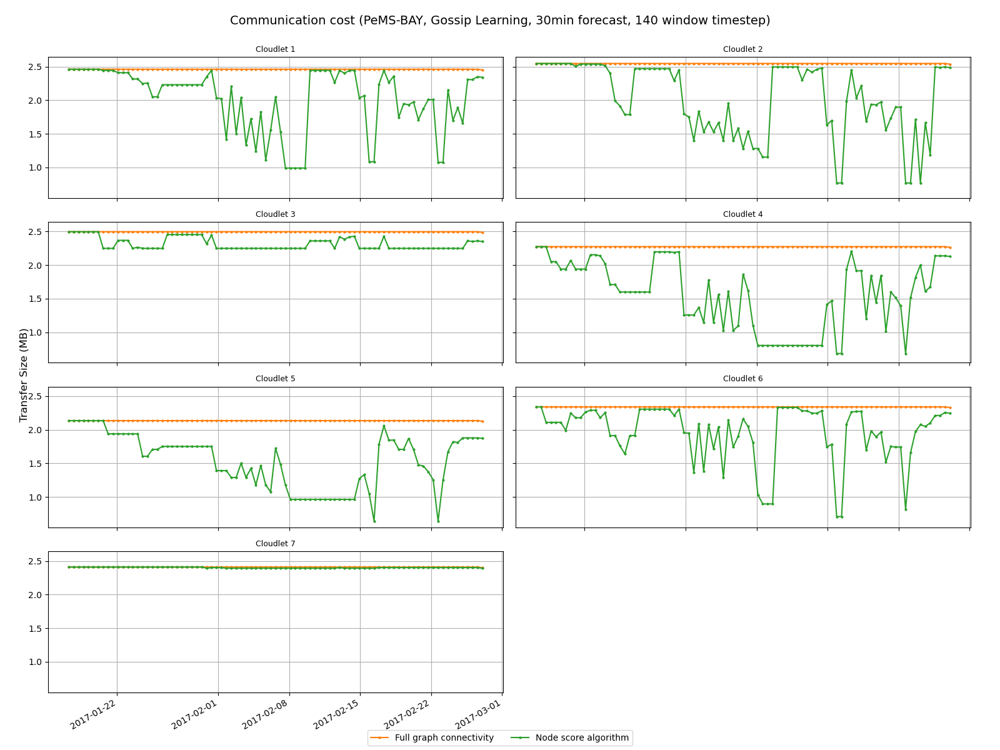

In [16]:
pems_bay__gossip_learning__30min__dps140__with_algorithm__log_folder = '../logs/2025-09-18_13-51-54_pems-bay_pred-30min_dps-140_gossip-learning-distance_online-training_with_algorithm'
pems_bay__gossip_learning__30min__dps140__no_graph_connectivity__log_folder = '../logs/2025-09-08_19-21-08_pems-bay_pred-30min_dps-140_gossip-learning-distance_online-training_no_graph_connectivity'
pems_bay__gossip_learning__30min__dps140__no_algorithm__log_folder = '../logs/2025-09-06_19-31-40_pems-bay_pred-30min_dps-140_gossip-learning-distance_online-training_no_algorithm'

pems_bay__plot_info = {
    "dataset": "PeMS-BAY",
    "setup": "Gossip Learning",
    "forecast": "30min",
    "dps": 140,
}

pems_bay__experiments = {
    # "No graph connectivity": {
    #     "folder": f"{pems_bay__gossip_learning__30min__dps140__no_graph_connectivity__log_folder}",
    #     "data_per_step": 140
    # },
    "Full graph connectivity": {
        "folder": f"{pems_bay__gossip_learning__30min__dps140__no_algorithm__log_folder}",
        "data_per_step": 140
    },
    "Node score algorithm": {
        "folder": f"{pems_bay__gossip_learning__30min__dps140__with_algorithm__log_folder}",
        "data_per_step": 140
    },
}

plot_pemsbay_communication_cost(pems_bay__experiments, pems_bay__plot_info)

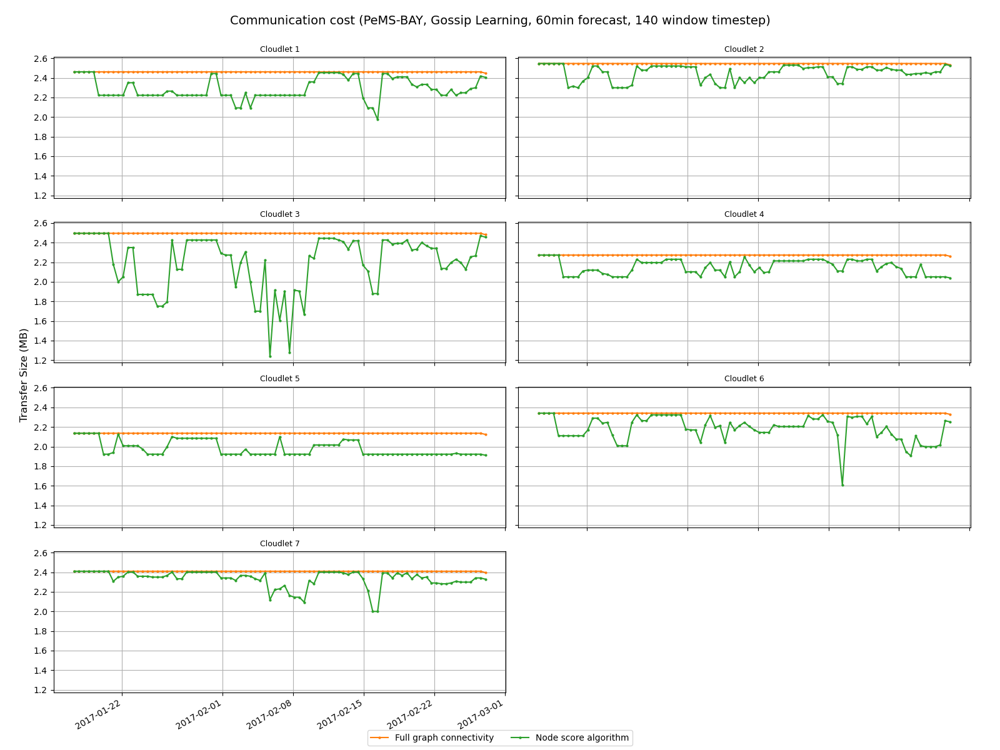

In [17]:
pems_bay__gossip_learning__60min__dps140__with_algorithm__log_folder = '../logs/2025-09-18_15-45-43_pems-bay_pred-60min_dps-140_gossip-learning-distance_online-training_with_algorithm'
pems_bay__gossip_learning__60min__dps140__no_graph_connectivity__log_folder = '../logs/2025-09-08_19-33-37_pems-bay_pred-60min_dps-140_gossip-learning-distance_online-training_no_algorithm' # it's actually no_graph_connectivity, I just named this log folder wrong
pems_bay__gossip_learning__60min__dps140__no_algorithm__log_folder = '../logs/2025-09-06_21-03-28_pems-bay_pred-60min_dps-140_gossip-learning-distance_online-training_no_algorithm'

pems_bay__plot_info = {
    "dataset": "PeMS-BAY",
    "setup": "Gossip Learning",
    "forecast": "60min",
    "dps": 140,
}

pems_bay__experiments = {
    # "No graph connectivity": {
    #     "folder": f"{pems_bay__gossip_learning__60min__dps140__no_graph_connectivity__log_folder}",
    #     "data_per_step": 140
    # },
    "Full graph connectivity": {
        "folder": f"{pems_bay__gossip_learning__60min__dps140__no_algorithm__log_folder}",
        "data_per_step": 140
    },
    "Node score algorithm": {
        "folder": f"{pems_bay__gossip_learning__60min__dps140__with_algorithm__log_folder}",
        "data_per_step": 140
    },
}

plot_pemsbay_communication_cost(pems_bay__experiments, pems_bay__plot_info)

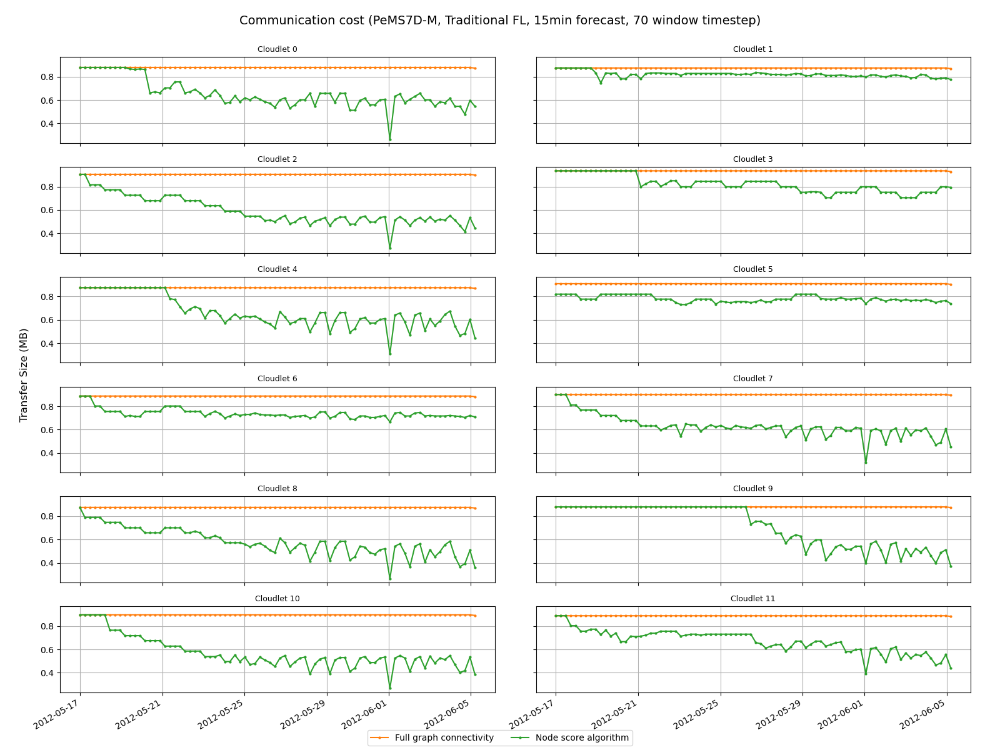

In [24]:
pems7d__trad_fl__15min__dps70__with_algorithm__log_folder = '../logs/2025-09-10_21-53-05_pemsd7-m_pred-15min_dps-70_trad-fl-distance_online-training_with_algorithm'
pems7d__trad_fl__15min__dps70__no_graph_connectivity__log_folder = '../logs/2025-09-08_16-26-30_pemsd7-m_pred-15min_dps-70_trad-fl-distance_online-training_no_graph_connectivity'
pems7d__trad_fl__15min__dps70__no_algorithm__log_folder = '../logs/2025-09-06_03-01-52_pemsd7-m_pred-15min_dps-70_trad-fl-distance_online-training_no_algorithm'

pems7d__plot_info = {
    "dataset": "PeMS7D-M",
    "setup": "Traditional FL",
    "forecast": "15min",
    "dps": 70,
}

pems7d__experiments = {
    # "No graph connectivity": {
    #     "folder": f"{pems7d__trad_fl__15min__dps70__no_graph_connectivity__log_folder}",
    #     "data_per_step": 70
    # },
    "Full graph connectivity": {
        "folder": f"{pems7d__trad_fl__15min__dps70__no_algorithm__log_folder}",
        "data_per_step": 70
    },
    "Node score algorithm": {
        "folder": f"{pems7d__trad_fl__15min__dps70__with_algorithm__log_folder}",
        "data_per_step": 70
    },
}

plot_pems7d_communication_cost(pems7d__experiments, pems7d__plot_info)

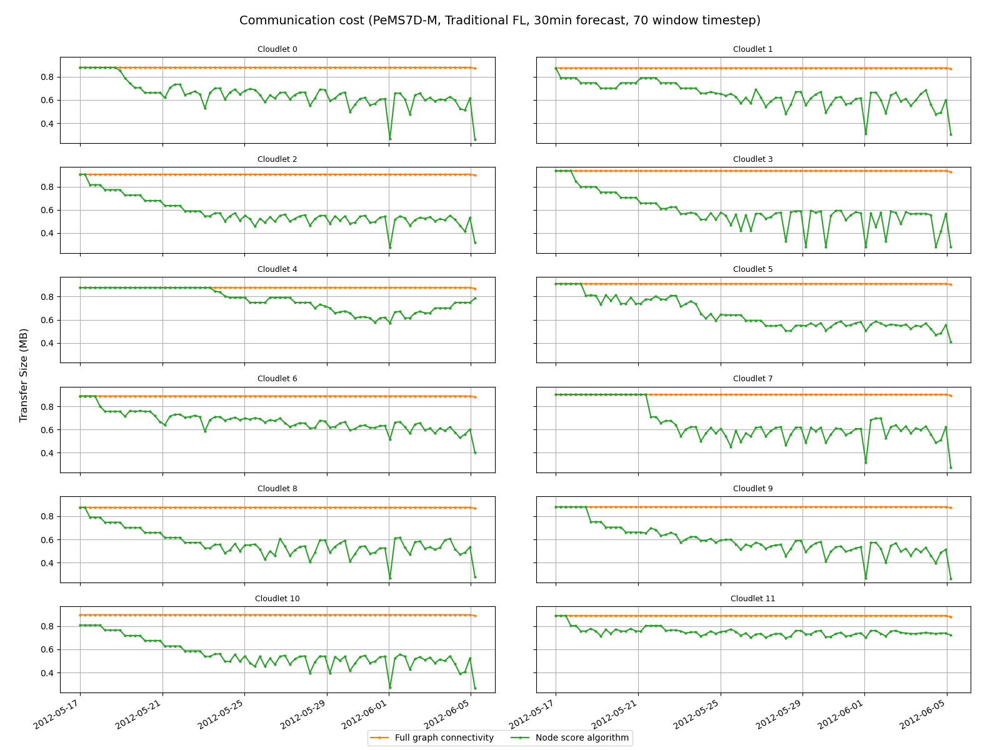

In [23]:
pems7d__trad_fl__30min__dps70__with_algorithm__log_folder = '../logs/2025-09-10_22-31-57_pemsd7-m_pred-30min_dps-70_trad-fl-distance_online-training_with_algorithm'
pems7d__trad_fl__30min__dps70__no_graph_connectivity__log_folder = '../logs/2025-09-08_16-40-57_pemsd7-m_pred-30min_dps-70_trad-fl-distance_online-training_no_graph_connectivity'
pems7d__trad_fl__30min__dps70__no_algorithm__log_folder = '../logs/2025-09-06_03-41-41_pemsd7-m_pred-30min_dps-70_trad-fl-distance_online-training_no_algorithm'

pems7d__plot_info = {
    "dataset": "PeMS7D-M",
    "setup": "Traditional FL",
    "forecast": "30min",
    "dps": 70,
}

pems7d__experiments = {
    # "No graph connectivity": {
    #     "folder": f"{pems7d__trad_fl__30min__dps70__no_graph_connectivity__log_folder}",
    #     "data_per_step": 70
    # },
    "Full graph connectivity": {
        "folder": f"{pems7d__trad_fl__30min__dps70__no_algorithm__log_folder}",
        "data_per_step": 70
    },
    "Node score algorithm": {
        "folder": f"{pems7d__trad_fl__30min__dps70__with_algorithm__log_folder}",
        "data_per_step": 70
    },
}

plot_pems7d_communication_cost(pems7d__experiments, pems7d__plot_info)

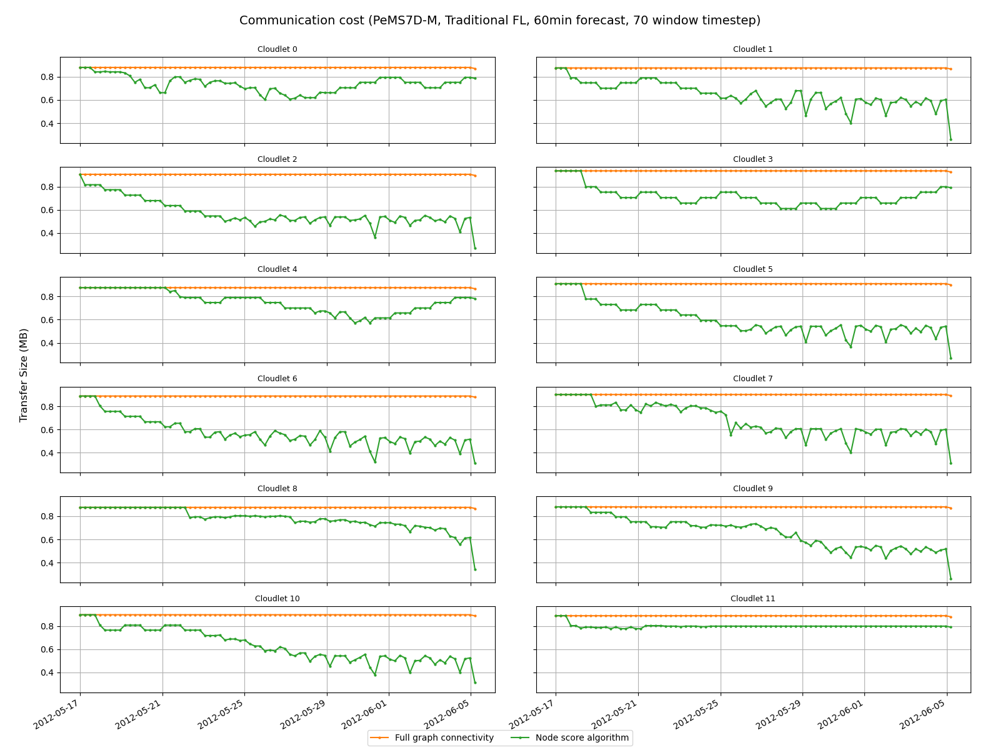

In [25]:
pems7d__trad_fl__60min__dps70__with_algorithm__log_folder = '../logs/2025-09-10_23-09-27_pemsd7-m_pred-60min_dps-70_trad-fl-distance_online-training_with_algorithm'
pems7d__trad_fl__60min__dps70__no_graph_connectivity__log_folder = '../logs/2025-09-08_16-55-33_pemsd7-m_pred-60min_dps-70_trad-fl-distance_online-training_no_graph_connectivity'
pems7d__trad_fl__60min__dps70__no_algorithm__log_folder = '../logs/2025-09-06_04-21-11_pemsd7-m_pred-60min_dps-70_trad-fl-distance_online-training_no_algorithm'

pems7d__plot_info = {
    "dataset": "PeMS7D-M",
    "setup": "Traditional FL",
    "forecast": "60min",
    "dps": 70
}

pems7d__experiments = {
    # "No graph connectivity": {
    #     "folder": f"{pems7d__trad_fl__60min__dps70__no_graph_connectivity__log_folder}",
    #     "data_per_step": 70
    # },
    "Full graph connectivity": {
        "folder": f"{pems7d__trad_fl__60min__dps70__no_algorithm__log_folder}",
        "data_per_step": 70
    },
    "Node score algorithm": {
        "folder": f"{pems7d__trad_fl__60min__dps70__with_algorithm__log_folder}",
        "data_per_step": 70
    },
}

plot_pems7d_communication_cost(pems7d__experiments, pems7d__plot_info)

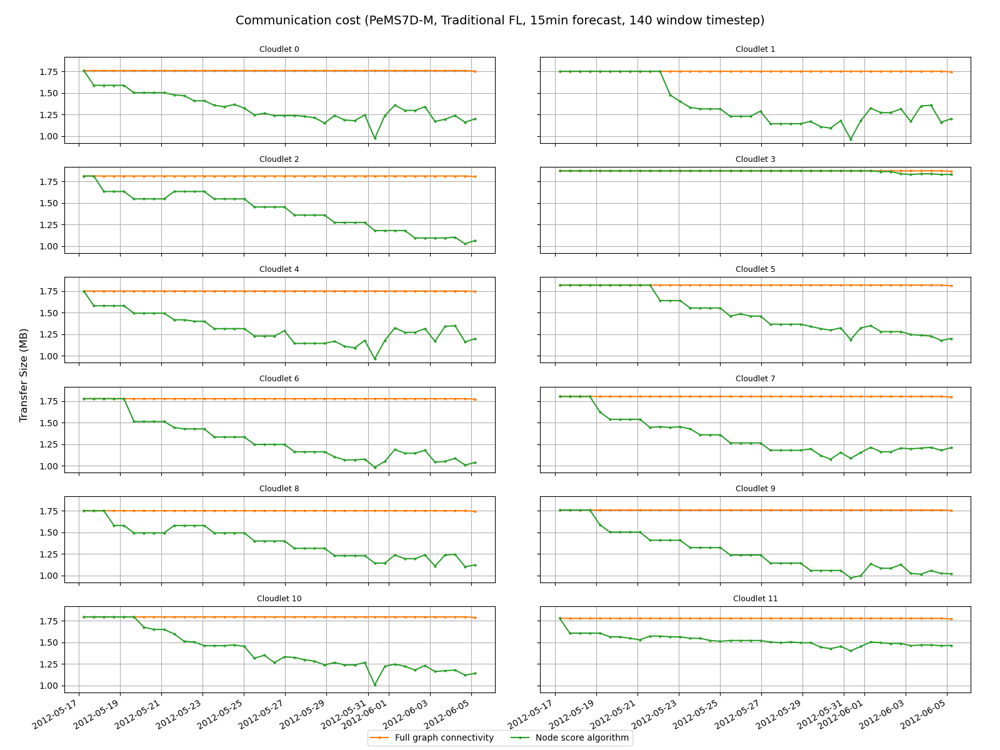

In [26]:
pems7d__trad_fl__15min__dps140__with_algorithm__log_folder = '../logs/2025-09-10_20-02-01_pemsd7-m_pred-15min_dps-140_trad-fl-distance_online-training_with_algorithm'
pems7d__trad_fl__15min__dps140__no_graph_connectivity__log_folder = '../logs/2025-09-08_15-43-26_pemsd7-m_pred-15min_dps-140_trad-fl-distance_online-training_no_graph_connectivity'
pems7d__trad_fl__15min__dps140__no_algorithm__log_folder = '../logs/2025-09-06_01-03-18_pemsd7-m_pred-15min_dps-140_trad-fl-distance_online-training_no_algorithm'

pems7d__plot_info = {
    "dataset": "PeMS7D-M",
    "setup": "Traditional FL",
    "forecast": "15min",
    "dps": 140
}

pems7d__experiments = {
    # "No graph connectivity": {
    #     "folder": f"{pems7d__trad_fl__15min__dps140__no_graph_connectivity__log_folder}",
    #     "data_per_step": 140
    # },
    "Full graph connectivity": {
        "folder": f"{pems7d__trad_fl__15min__dps140__no_algorithm__log_folder}",
        "data_per_step": 140
    },
    "Node score algorithm": {
        "folder": f"{pems7d__trad_fl__15min__dps140__with_algorithm__log_folder}",
        "data_per_step": 140
    },
}

plot_pems7d_communication_cost(pems7d__experiments, pems7d__plot_info)

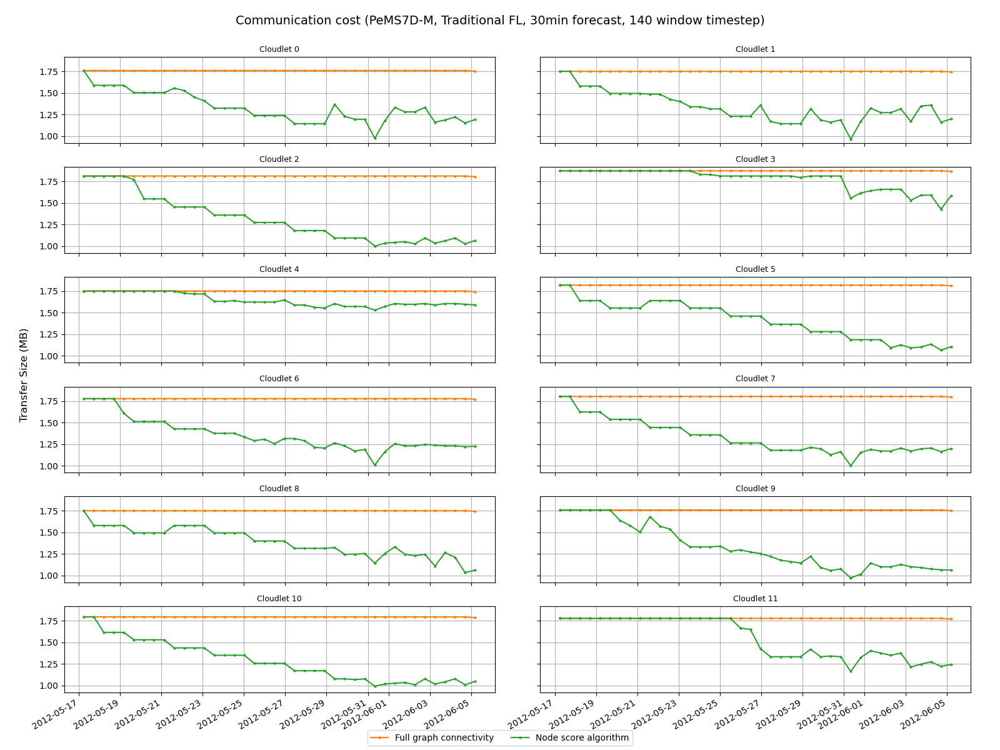

In [27]:
pems7d__trad_fl__30min__dps140__with_algorithm__log_folder = '../logs/2025-09-10_20-38-50_pemsd7-m_pred-30min_dps-140_trad-fl-distance_online-training_with_algorithm'
pems7d__trad_fl__30min__dps140__no_graph_connectivity__log_folder = '../logs/2025-09-08_15-57-43_pemsd7-m_pred-30min_dps-140_trad-fl-distance_online-training_no_graph_connectivity'
pems7d__trad_fl__30min__dps140__no_algorithm__log_folder = '../logs/2025-09-06_01-42-41_pemsd7-m_pred-30min_dps-140_trad-fl-distance_online-training_no_algorithm'

pems7d__plot_info = {
    "dataset": "PeMS7D-M",
    "setup": "Traditional FL",
    "forecast": "30min",
    "dps": 140
}

pems7d__experiments = {
    # "No graph connectivity": {
    #     "folder": f"{pems7d__trad_fl__30min__dps140__no_graph_connectivity__log_folder}",
    #     "data_per_step": 140
    # },
    "Full graph connectivity": {
        "folder": f"{pems7d__trad_fl__30min__dps140__no_algorithm__log_folder}",
        "data_per_step": 140
    },
    "Node score algorithm": {
        "folder": f"{pems7d__trad_fl__30min__dps140__with_algorithm__log_folder}",
        "data_per_step": 140
    },
}

plot_pems7d_communication_cost(pems7d__experiments, pems7d__plot_info)

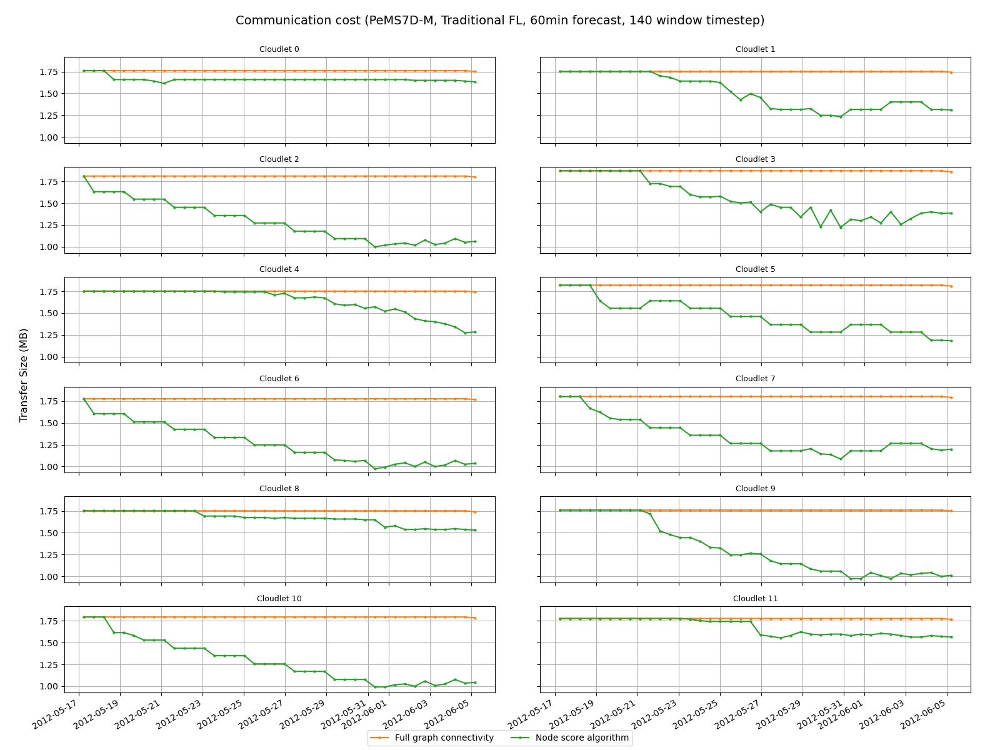

In [28]:
pems7d__trad_fl__60min__dps140__with_algorithm__log_folder = '../logs/2025-09-10_21-15-40_pemsd7-m_pred-60min_dps-140_trad-fl-distance_online-training_with_algorithm'
pems7d__trad_fl__60min__dps140__no_graph_connectivity__log_folder = '../logs/2025-09-08_16-12-09_pemsd7-m_pred-60min_dps-140_trad-fl-distance_online-training_no_graph_connectivity'
pems7d__trad_fl__60min__dps140__no_algorithm__log_folder = '../logs/2025-09-06_02-22-13_pemsd7-m_pred-60min_dps-140_trad-fl-distance_online-training_no_algorithm'

pems7d__plot_info = {
    "dataset": "PeMS7D-M",
    "setup": "Traditional FL",
    "forecast": "60min",
    "dps": 140
}

pems7d__experiments = {
    # "No graph connectivity": {
    #     "folder": f"{pems7d__trad_fl__60min__dps140__no_graph_connectivity__log_folder}",
    #     "data_per_step": 140
    # },
    "Full graph connectivity": {
        "folder": f"{pems7d__trad_fl__60min__dps140__no_algorithm__log_folder}",
        "data_per_step": 140
    },
    "Node score algorithm": {
        "folder": f"{pems7d__trad_fl__60min__dps140__with_algorithm__log_folder}",
        "data_per_step": 140
    },
}

plot_pems7d_communication_cost(pems7d__experiments, pems7d__plot_info)

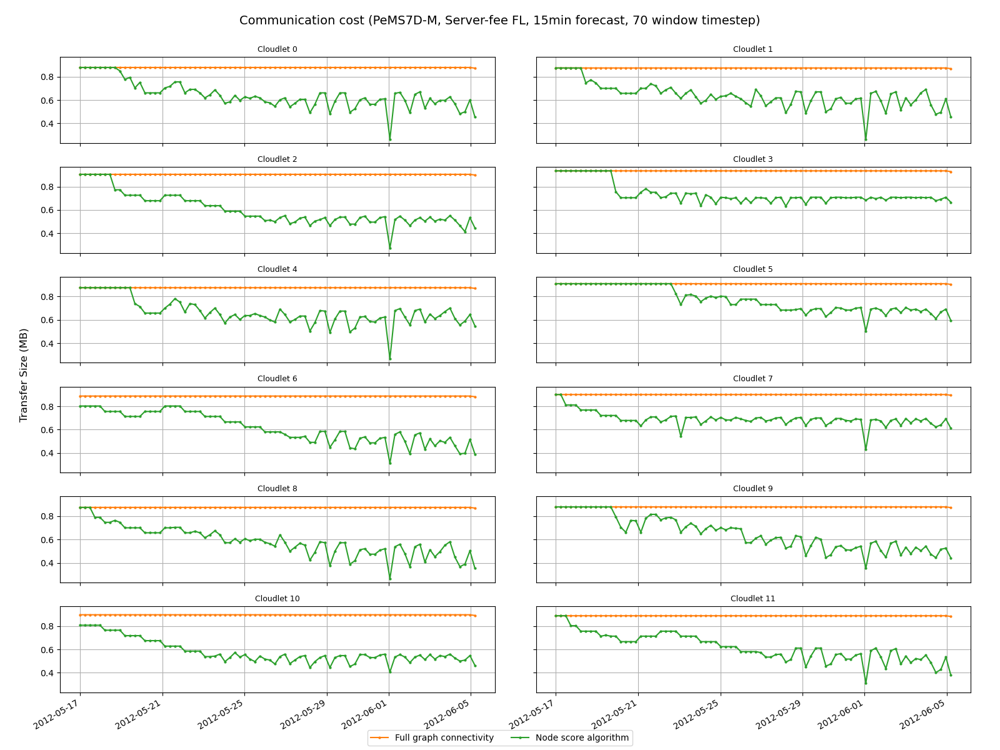

In [29]:
pems7d__server_free_fl__15min__dps70__with_algorithm__log_folder = '../logs/2025-09-13_01-14-49_pemsd7-m_pred-15min_dps-70_server-free-fl-distance_online-training_with_algorithm'
pems7d__server_free_fl__15min__dps70__no_graph_connectivity__log_folder = '../logs/2025-09-08_18-46-43_pemsd7-m_pred-15min_dps-70_server-free-fl-distance_online-training_no_graph_connectivity'
pems7d__server_free_fl__15min__dps70__no_algorithm__log_folder = '../logs/2025-09-06_16-06-16_pemsd7-m_pred-15min_dps-70_server-free-fl-distance_online-training_no_algorithm'

pems7d__plot_info = {
    "dataset": "PeMS7D-M",
    "setup": "Server-fee FL",
    "forecast": "15min",
    "dps": 70
}

pems7d__experiments = {
    # "No graph connectivity": {
    #     "folder": f"{pems7d__server_free_fl__15min__dps70__no_graph_connectivity__log_folder}",
    #     "data_per_step": 70
    # },
    "Full graph connectivity": {
        "folder": f"{pems7d__server_free_fl__15min__dps70__no_algorithm__log_folder}",
        "data_per_step": 70
    },
    "Node score algorithm": {
        "folder": f"{pems7d__server_free_fl__15min__dps70__with_algorithm__log_folder}",
        "data_per_step": 70
    },
}

plot_pems7d_communication_cost(pems7d__experiments, pems7d__plot_info)

/tmp/ipykernel_2277059/83651621.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = plt.subplots(rows, cols, figsize=(16, 12), sharex=True, sharey=True)


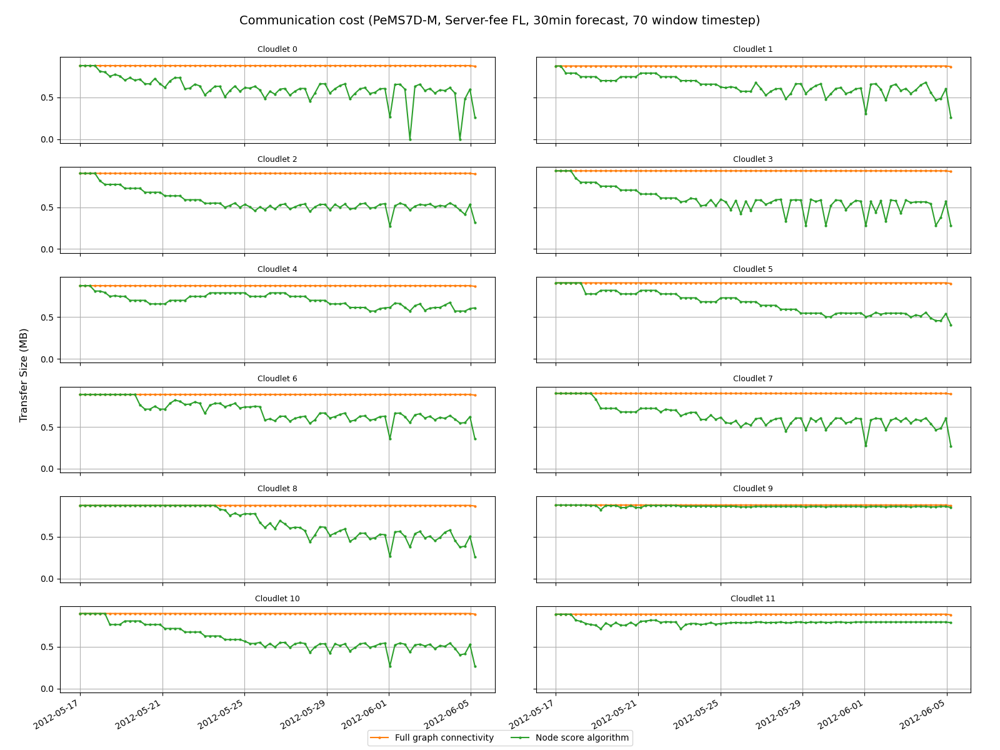

In [30]:
pems7d__server_free_fl__30min__dps70__with_algorithm__log_folder = '../logs/2025-09-13_01-53-59_pemsd7-m_pred-30min_dps-70_server-free-fl-distance_online-training_with_algorithm'
pems7d__server_free_fl__30min__dps70__no_graph_connectivity__log_folder = '../logs/2025-09-08_18-54-02_pemsd7-m_pred-30min_dps-70_server-free-fl-distance_online-training_no_graph_connectivity'
pems7d__server_free_fl__30min__dps70__no_algorithm__log_folder = '../logs/2025-09-06_16-43-58_pemsd7-m_pred-30min_dps-70_server-free-fl-distance_online-training_no_algorithm'

pems7d__plot_info = {
    "dataset": "PeMS7D-M",
    "setup": "Server-fee FL",
    "forecast": "30min",
    "dps": 70
}

pems7d__experiments = {
    # "No graph connectivity": {
    #     "folder": f"{pems7d__server_free_fl__30min__dps70__no_graph_connectivity__log_folder}",
    #     "data_per_step": 70
    # },
    "Full graph connectivity": {
        "folder": f"{pems7d__server_free_fl__30min__dps70__no_algorithm__log_folder}",
        "data_per_step": 70
    },
    "Node score algorithm": {
        "folder": f"{pems7d__server_free_fl__30min__dps70__with_algorithm__log_folder}",
        "data_per_step": 70
    },
}

plot_pems7d_communication_cost(pems7d__experiments, pems7d__plot_info)

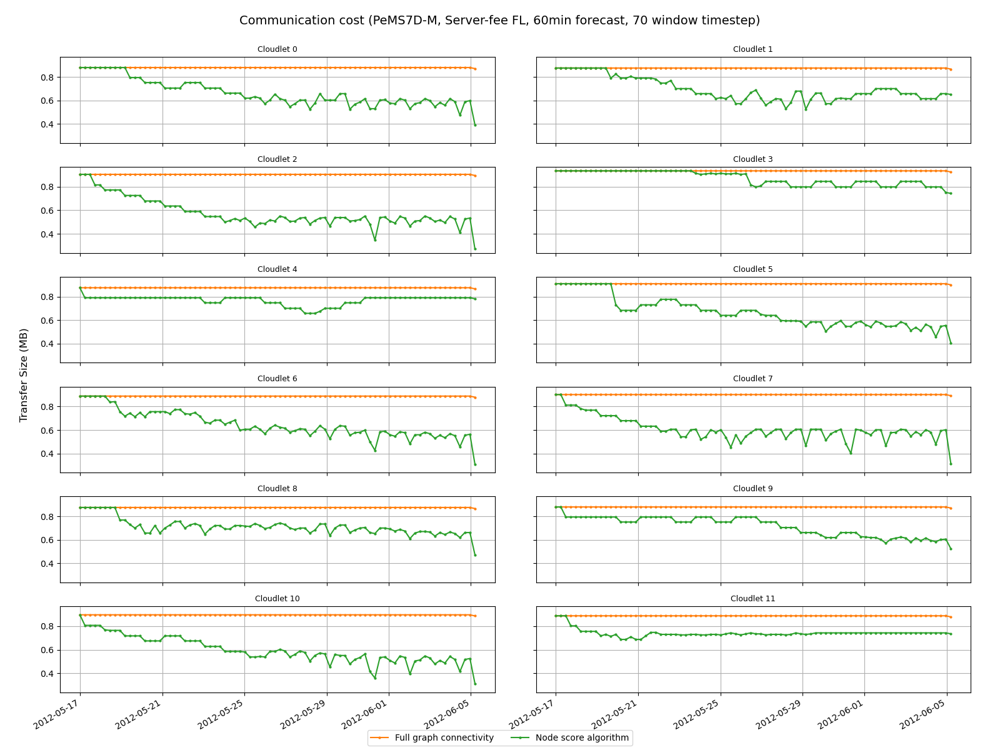

In [32]:
pems7d__server_free_fl__60min__dps70__with_algorithm__log_folder = '../logs/2025-09-13_02-33-58_pemsd7-m_pred-60min_dps-70_server-free-fl-distance_online-training_with_algorithm'
pems7d__server_free_fl__60min__dps70__no_graph_connectivity__log_folder = '../logs/2025-09-08_19-01-20_pemsd7-m_pred-60min_dps-70_server-free-fl-distance_online-training_no_graph-connectivity'
pems7d__server_free_fl__60min__dps70__no_algorithm__log_folder = '../logs/2025-09-06_17-21-37_pemsd7-m_pred-60min_dps-70_server-free-fl-distance_online-training_no_algorithm'

pems7d__plot_info = {
    "dataset": "PeMS7D-M",
    "setup": "Server-fee FL",
    "forecast": "60min",
    "dps": 70
}

pems7d__experiments = {
    # "No graph connectivity": {
    #     "folder": f"{pems7d__server_free_fl__60min__dps70__no_graph_connectivity__log_folder}",
    #     "data_per_step": 70
    # },
    "Full graph connectivity": {
        "folder": f"{pems7d__server_free_fl__60min__dps70__no_algorithm__log_folder}",
        "data_per_step": 70
    },
    "Node score algorithm": {
        "folder": f"{pems7d__server_free_fl__60min__dps70__with_algorithm__log_folder}",
        "data_per_step": 70
    },
}

plot_pems7d_communication_cost(pems7d__experiments, pems7d__plot_info)

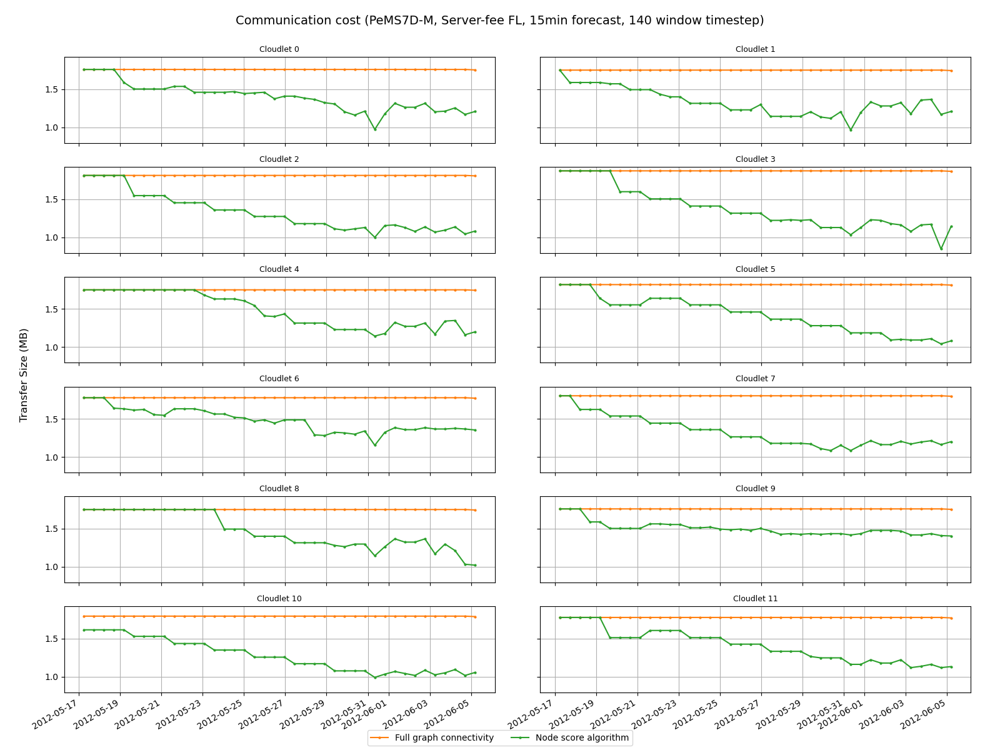

In [33]:
pems7d__server_free_fl__15min__dps140__with_algorithm__log_folder = '../logs/2025-09-12_23-28-09_pemsd7-m_pred-15min_dps-140_server-free-fl-distance_online-training_with_algorithm'
pems7d__server_free_fl__15min__dps140__no_graph_connectivity__log_folder = '../logs/2025-09-08_18-25-25_pemsd7-m_pred-15min_dps-140_server-free-fl-distance_online-training_no_graph-connectivity'
pems7d__server_free_fl__15min__dps140__no_algorithm__log_folder = '../logs/2025-09-06_14-13-47_pemsd7-m_pred-15min_dps-140_server-free-fl-distance_online-training_no_algorithm'

pems7d__plot_info = {
    "dataset": "PeMS7D-M",
    "setup": "Server-fee FL",
    "forecast": "15min",
    "dps": 140
}

pems7d__experiments = {
    # "No graph connectivity": {
    #     "folder": f"{pems7d__server_free_fl__15min__dps140__no_graph_connectivity__log_folder}",
    #     "data_per_step": 140
    # },
    "Full graph connectivity": {
        "folder": f"{pems7d__server_free_fl__15min__dps140__no_algorithm__log_folder}",
        "data_per_step": 140
    },
    "Node score algorithm": {
        "folder": f"{pems7d__server_free_fl__15min__dps140__with_algorithm__log_folder}",
        "data_per_step": 140
    },
}

plot_pems7d_communication_cost(pems7d__experiments, pems7d__plot_info)

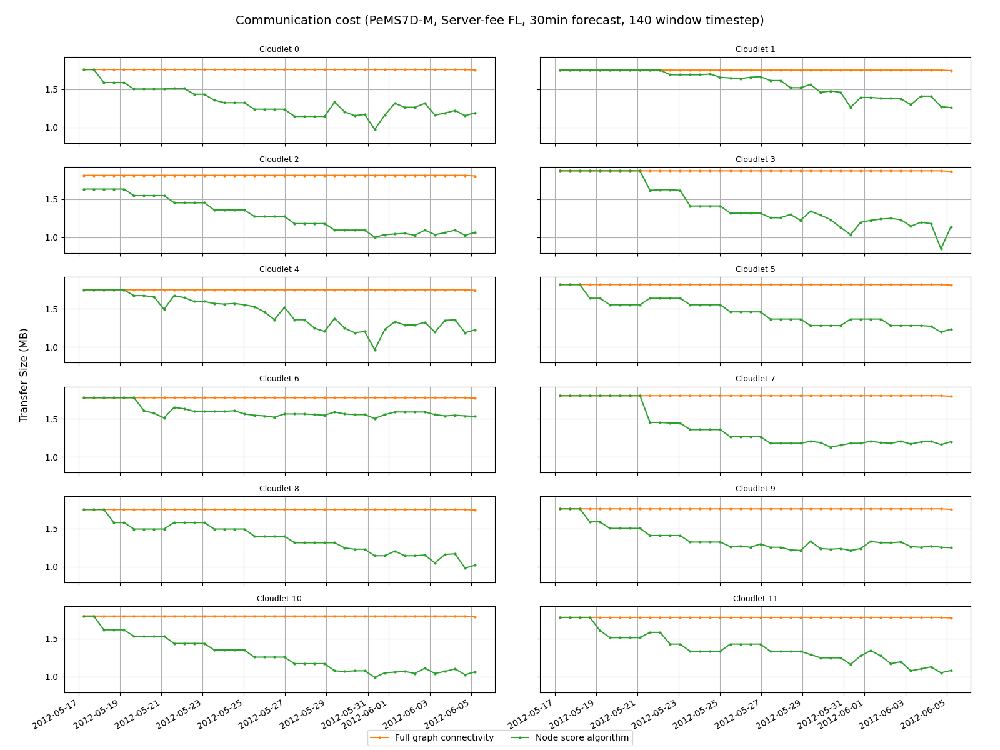

In [34]:
pems7d__server_free_fl__30min__dps140__with_algorithm__log_folder = '../logs/2025-09-13_00-03-24_pemsd7-m_pred-30min_dps-140_server-free-fl-distance_online-training_with_algorithm'
pems7d__server_free_fl__30min__dps140__no_graph_connectivity__log_folder = '../logs/2025-09-08_18-32-31_pemsd7-m_pred-30min_dps-140_server-free-fl-distance_online-training_no_graph_connectivity'
pems7d__server_free_fl__30min__dps140__no_algorithm__log_folder = '../logs/2025-09-06_14-51-20_pemsd7-m_pred-30min_dps-140_server-free-fl-distance_online-training_no_algorithm'

pems7d__plot_info = {
    "dataset": "PeMS7D-M",
    "setup": "Server-fee FL",
    "forecast": "30min",
    "dps": 140
}

pems7d__experiments = {
    # "No graph connectivity": {
    #     "folder": f"{pems7d__server_free_fl__30min__dps140__no_graph_connectivity__log_folder}",
    #     "data_per_step": 140
    # },
    "Full graph connectivity": {
        "folder": f"{pems7d__server_free_fl__30min__dps140__no_algorithm__log_folder}",
        "data_per_step": 140
    },
    "Node score algorithm": {
        "folder": f"{pems7d__server_free_fl__30min__dps140__with_algorithm__log_folder}",
        "data_per_step": 140
    },
}

plot_pems7d_communication_cost(pems7d__experiments, pems7d__plot_info)

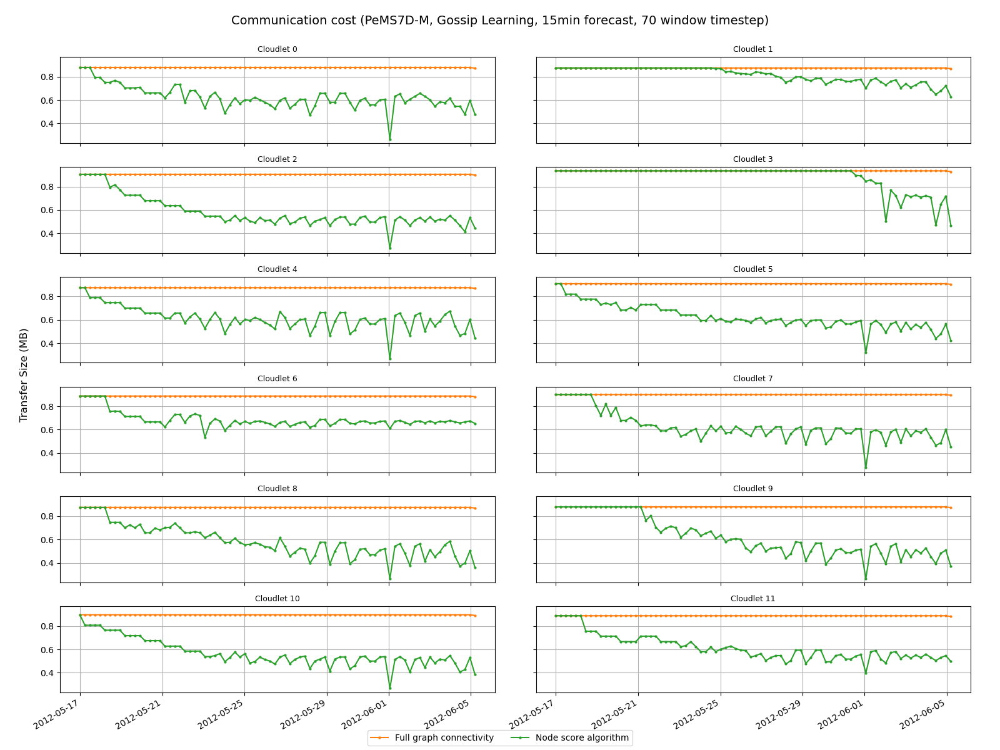

In [36]:
pems7d__gossip_learning__15min__dps70__with_algorithm__log_folder = '../logs/2025-09-19_03-04-28_pemsd7-m_pred-15min_dps-70_gossip-learning-distance_online-training_with_algorithm'
pems7d__gossip_learning__15min__dps70__no_graph_connectivity__log_folder = '../logs/2025-09-08_20-45-34_pemsd7-m_pred-15min_dps-70_gossip-learning-distance_online-training_no_graph_connectivity'
pems7d__gossip_learning__15min__dps70__no_algorithm__log_folder = '../logs/2025-09-07_05-04-00_pemsd7-m_pred-15min_dps-70_gossip-learning-distance_online-training_no_algorithm'

pems7d__plot_info = {
    "dataset": "PeMS7D-M",
    "setup": "Gossip Learning",
    "forecast": "15min",
    "dps": 70
}

pems7d__experiments = {
    # "No graph connectivity": {
    #     "folder": f"{pems7d__gossip_learning__15min__dps70__no_graph_connectivity__log_folder}",
    #     "data_per_step": 70
    # },
    "Full graph connectivity": {
        "folder": f"{pems7d__gossip_learning__15min__dps70__no_algorithm__log_folder}",
        "data_per_step": 70
    },
    "Node score algorithm": {
        "folder": f"{pems7d__gossip_learning__15min__dps70__with_algorithm__log_folder}",
        "data_per_step": 70
    },
}

plot_pems7d_communication_cost(pems7d__experiments, pems7d__plot_info)

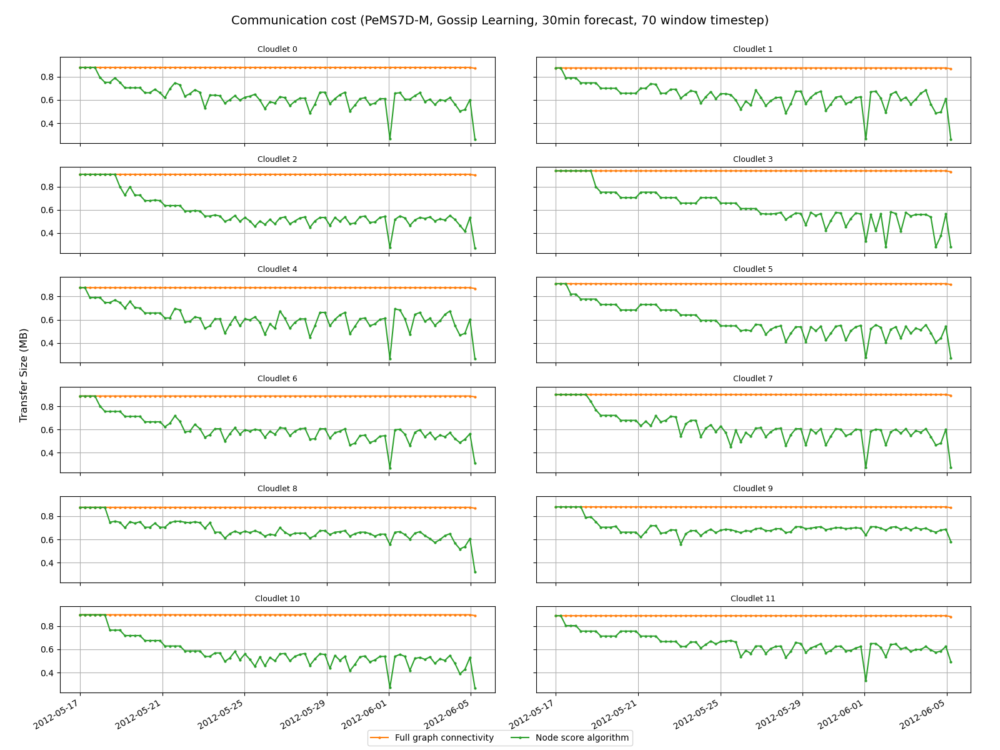

In [39]:
pems7d__gossip_learning__30min__dps70__with_algorithm__log_folder = '../logs/2025-09-19_03-42-05_pemsd7-m_pred-30min_dps-70_gossip-learning-distance_online-training_with_algorithm'
pems7d__gossip_learning__30min__dps70__no_graph_connectivity__log_folder = '../logs/2025-09-08_20-52-54_pemsd7-m_pred-30min_dps-70_gossip-learning-distance_online-training_no_graph_connectivity'
pems7d__gossip_learning__30min__dps70__no_algorithm__log_folder = '../logs/2025-09-07_05-41-42_pemsd7-m_pred-30min_dps-70_gossip-learning-distance_online-training_no_algorithm'

pems7d__plot_info = {
    "dataset": "PeMS7D-M",
    "setup": "Gossip Learning",
    "forecast": "30min",
    "dps": 70
}

pems7d__experiments = {
    # "No graph connectivity": {
    #     "folder": f"{pems7d__gossip_learning__30min__dps70__no_graph_connectivity__log_folder}",
    #     "data_per_step": 70
    # },
    "Full graph connectivity": {
        "folder": f"{pems7d__gossip_learning__30min__dps70__no_algorithm__log_folder}",
        "data_per_step": 70
    },
    "Node score algorithm": {
        "folder": f"{pems7d__gossip_learning__30min__dps70__with_algorithm__log_folder}",
        "data_per_step": 70
    },
}

plot_pems7d_communication_cost(pems7d__experiments, pems7d__plot_info)

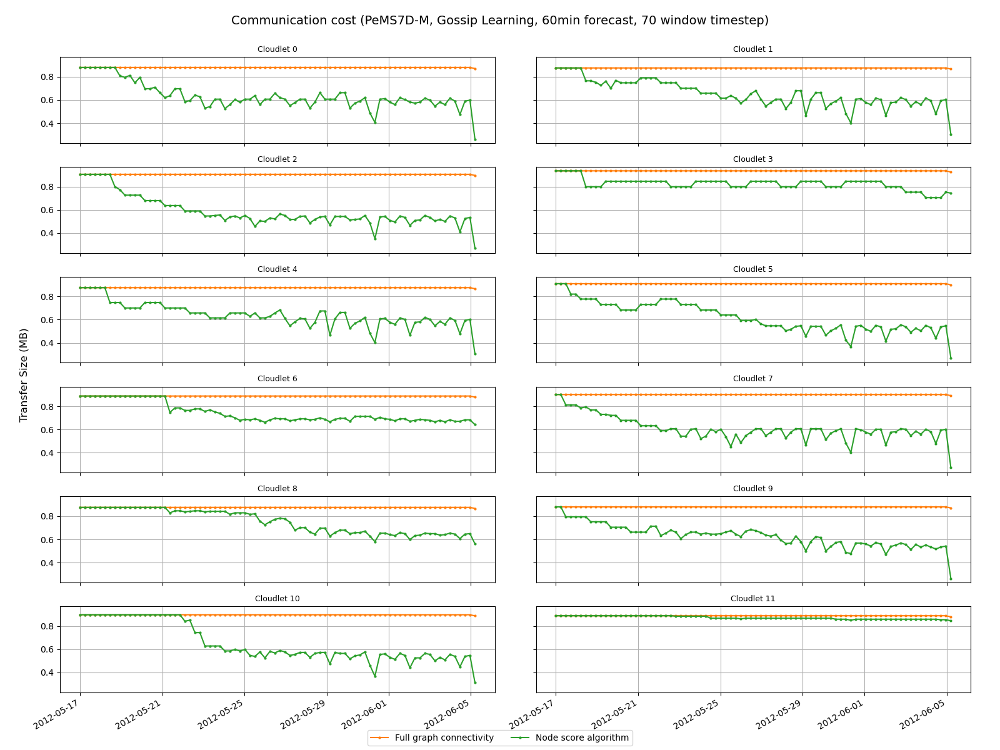

In [42]:
pems7d__gossip_learning__60min__dps70__with_algorithm__log_folder = '../logs/2025-09-19_04-18-57_pemsd7-m_pred-60min_dps-70_gossip-learning-distance_online-training_with_algorithm'
pems7d__gossip_learning__60min__dps70__no_graph_connectivity__log_folder = '../logs/2025-09-08_21-00-14_pemsd7-m_pred-60min_dps-70_gossip-learning-distance_online-training_no_graph_connectivity'
pems7d__gossip_learning__60min__dps70__no_algorithm__log_folder = '../logs/2025-09-07_06-19-22_pemsd7-m_pred-60min_dps-70_gossip-learning-distance_online-training_no_algorithm'

pems7d__plot_info = {
    "dataset": "PeMS7D-M",
    "setup": "Gossip Learning",
    "forecast": "60min",
    "dps": 70
}

pems7d__experiments = {
    # "No graph connectivity": {
    #     "folder": f"{pems7d__gossip_learning__60min__dps70__no_graph_connectivity__log_folder}",
    #     "data_per_step": 70
    # },
    "Full graph connectivity": {
        "folder": f"{pems7d__gossip_learning__60min__dps70__no_algorithm__log_folder}",
        "data_per_step": 70
    },
    "Node score algorithm": {
        "folder": f"{pems7d__gossip_learning__60min__dps70__with_algorithm__log_folder}",
        "data_per_step": 70
    },
}

plot_pems7d_communication_cost(pems7d__experiments, pems7d__plot_info)

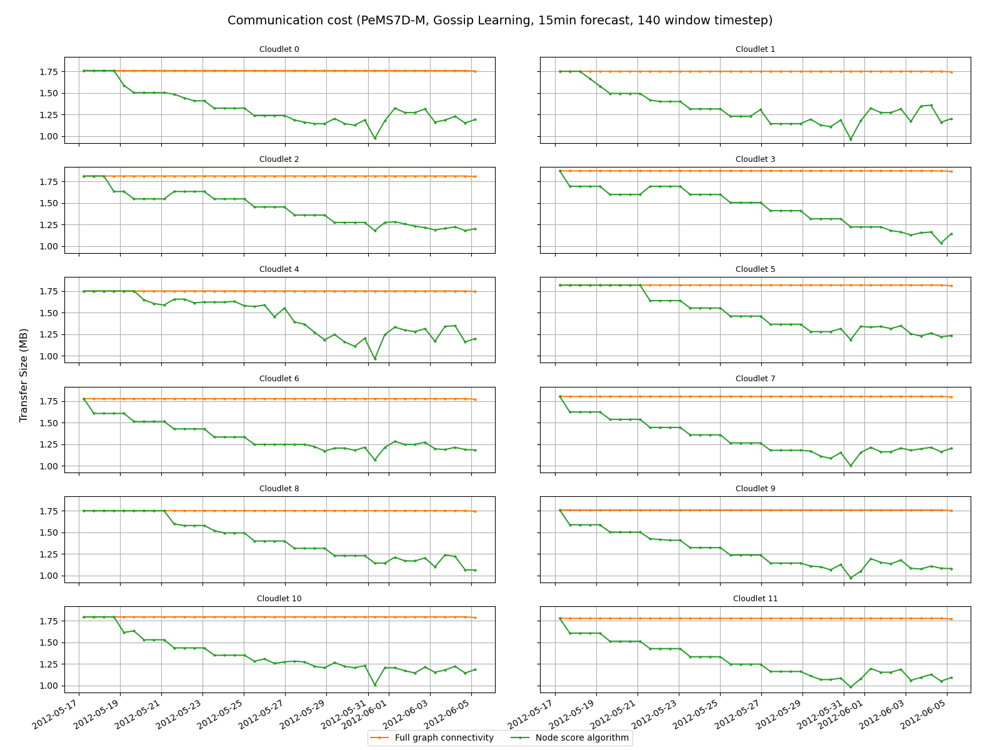

In [43]:
pems7d__gossip_learning__15min__dps140__with_algorithm__log_folder = '../logs/2025-09-19_01-18-27_pemsd7-m_pred-15min_dps-140_gossip-learning-distance_online-training_with_algorithm'
pems7d__gossip_learning__15min__dps140__no_graph_connectivity__log_folder = '../logs/2025-09-08_20-24-17_pemsd7-m_pred-15min_dps-140_gossip-learning-distance_online-training_no_graph_connectivity'
pems7d__gossip_learning__15min__dps140__no_algorithm__log_folder = '../logs/2025-09-07_03-11-24_pemsd7-m_pred-15min_dps-140_gossip-learning-distance_online-training_no_algorithm'

pems7d__plot_info = {
    "dataset": "PeMS7D-M",
    "setup": "Gossip Learning",
    "forecast": "15min",
    "dps": 140
}

pems7d__experiments = {
    # "No graph connectivity": {
    #     "folder": f"{pems7d__gossip_learning__15min__dps140__no_graph_connectivity__log_folder}",
    #     "data_per_step": 140
    # },
    "Full graph connectivity": {
        "folder": f"{pems7d__gossip_learning__15min__dps140__no_algorithm__log_folder}",
        "data_per_step": 140
    },
    "Node score algorithm": {
        "folder": f"{pems7d__gossip_learning__15min__dps140__with_algorithm__log_folder}",
        "data_per_step": 140
    },
}

plot_pems7d_communication_cost(pems7d__experiments, pems7d__plot_info)

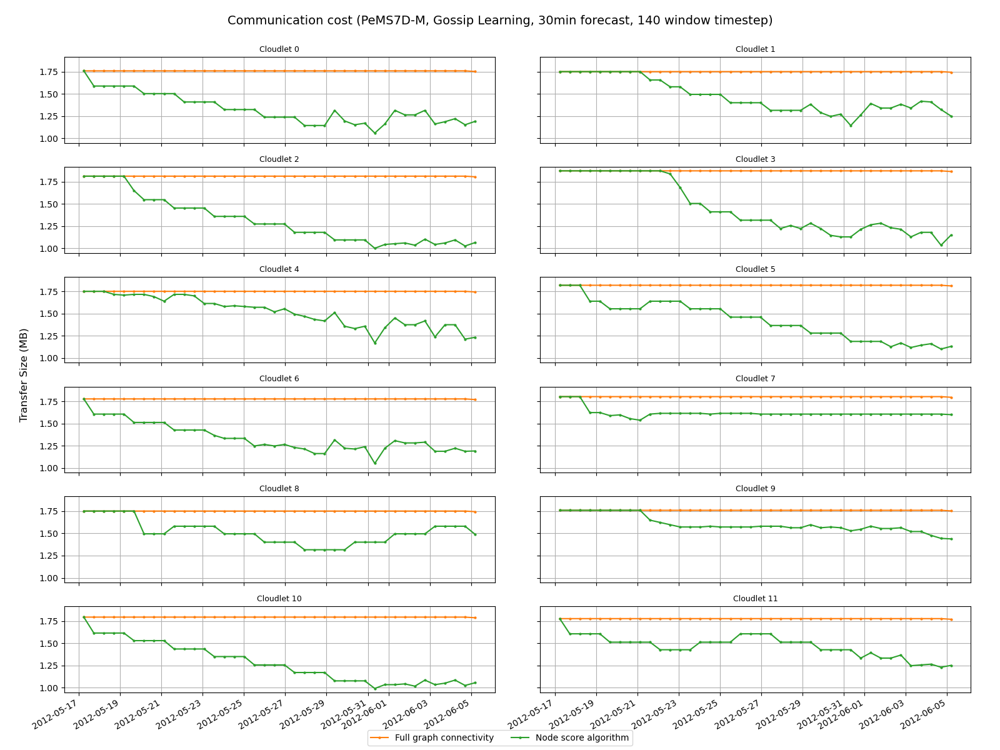

In [44]:
pems7d__gossip_learning__30min__dps140__with_algorithm__log_folder = '../logs/2025-09-19_01-52-17_pemsd7-m_pred-30min_dps-140_gossip-learning-distance_online-training_with_algorithm'
pems7d__gossip_learning__30min__dps140__no_graph_connectivity__log_folder = '../logs/2025-09-08_20-31-23_pemsd7-m_pred-30min_dps-140_gossip-learning-distance_online-training_no_graph_connectivity'
pems7d__gossip_learning__30min__dps140__no_algorithm__log_folder = '../logs/2025-09-07_03-48-56_pemsd7-m_pred-30min_dps-140_gossip-learning-distance_online-training_no_algorithm'

pems7d__plot_info = {
    "dataset": "PeMS7D-M",
    "setup": "Gossip Learning",
    "forecast": "30min",
    "dps": 140
}

pems7d__experiments = {
    # "No graph connectivity": {
    #     "folder": f"{pems7d__gossip_learning__30min__dps140__no_graph_connectivity__log_folder}",
    #     "data_per_step": 140
    # },
    "Full graph connectivity": {
        "folder": f"{pems7d__gossip_learning__30min__dps140__no_algorithm__log_folder}",
        "data_per_step": 140
    },
    "Node score algorithm": {
        "folder": f"{pems7d__gossip_learning__30min__dps140__with_algorithm__log_folder}",
        "data_per_step": 140
    },
}

plot_pems7d_communication_cost(pems7d__experiments, pems7d__plot_info)

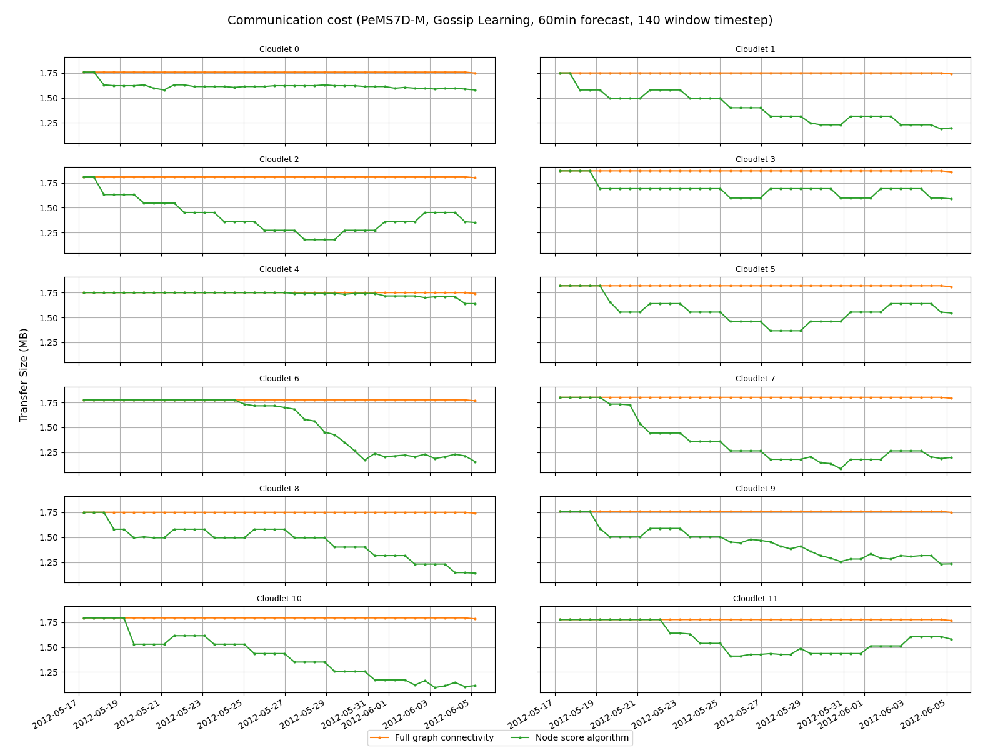

In [45]:
pems7d__gossip_learning__60min__dps140__with_algorithm__log_folder = '../logs/2025-09-19_02-27-38_pemsd7-m_pred-60min_dps-140_gossip-learning-distance_online-training_with_algorithm'
pems7d__gossip_learning__60min__dps140__no_graph_connectivity__log_folder = '../logs/2025-09-08_20-38-29_pemsd7-m_pred-60min_dps-140_gossip-learning-distance_online-training_no_graph_connectivity'
pems7d__gossip_learning__60min__dps140__no_algorithm__log_folder = '../logs/2025-09-07_04-26-26_pemsd7-m_pred-60min_dps-140_gossip-learning-distance_online-training_no_algorithm'

pems7d__plot_info = {
    "dataset": "PeMS7D-M",
    "setup": "Gossip Learning",
    "forecast": "60min",
    "dps": 140
}

pems7d__experiments = {
    # "No graph connectivity": {
    #     "folder": f"{pems7d__gossip_learning__60min__dps140__no_graph_connectivity__log_folder}",
    #     "data_per_step": 140
    # },
    "Full graph connectivity": {
        "folder": f"{pems7d__gossip_learning__60min__dps140__no_algorithm__log_folder}",
        "data_per_step": 140
    },
    "Node score algorithm": {
        "folder": f"{pems7d__gossip_learning__60min__dps140__with_algorithm__log_folder}",
        "data_per_step": 140
    },
}

plot_pems7d_communication_cost(pems7d__experiments, pems7d__plot_info)